In [1]:
%load_ext autoreload
%autoreload 2
#python v3.11.3

In [2]:

import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

import os
import datetime

import numpy as np #v1.25.0
import pandas as pd #v2.0.3

import scipy #v1.10.1
import scipy.stats as stats
from scipy.optimize import curve_fit
import pingouin as pg

import seaborn as sns #v0.13.0
import matplotlib as mpl #v3.8.1
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates

from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection


# these files should be in the same directory as this Jupyter notebook
from format_arduino_data import *
from lickfrequency_analysis import *
from plot_data import *

# to set styles for plotting
mpl.style.use(r"C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\mouse_analysis\full_trial_analysis\mouse_analysis.mplstyle")

#to suppress inaccurate pandas reassignment warnings
pd.options.mode.chained_assignment = None  # default='warn'

In [3]:
def load_data(path, data_type, data_name, conds, dtype_map, cols):
    dataset  = []
    cols = cols.copy()
    for cond in conds:
        o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)
        rm = []
        for c in cols:
            if c not in o_data.columns:
                rm.append(c)
        for c in rm:
            cols.remove(c)
        o_data = o_data[cols]
        dataset.append(o_data)
    dataset = pd.concat(dataset)
    dataset = dataset.replace({pd.NA:'u'})
    return dataset

def format_strain(df):
    df.loc[(df['Strain'] == 'SSTcre/Ai32-')|(df['Strain'] == 'Sscre x Ai32 -'), 'Strain'] = 'SSTcre x Ai32-'
    df.loc[(df['Strain'] == 'SSTcre x Ai32')|(df['Strain'] == 'Sscre x Ai32'), 'Strain'] = 'SSTcre x Ai32'
    df.loc[(df['Strain'] == 'SSTcre')|(df['Strain'] == 'Sscre'), 'Strain'] = 'SSTcre'
    df.loc[(df['Strain']=='Scnn-cre')|(df['Strain']=='Scnn-cre + 6OHDA')|(df['Strain']=='Scnn-cre+6OHDA partial'), 'Strain'] = 'Scnn-cre'
    df.loc[(df['Strain']=='.1-3/sscre'), 'Strain'] = '.1-3 x SSTcre'
    df.loc[df['Strain'] == '1-3 x Scnn-cre (1-3 WT)', 'Strain'] = '.1-3- x Scnn-cre'
    df.loc[df['Strain'] == '1-3 x Scnn-cre (1-3 Het)', 'Strain'] = '.1-3+ x Scnn-cre'

def format_condition(df):
    df["cond"] = df["condition"].replace({"hm4di_cno": "hM4Di + CNO", "mcherry_cno": "mCherry + CNO", 
                            '0.1 mg DCZ hm4di': "hM4Di + DCZ", 
                            '0.1 mg DCZ mcherry': "mCherry + DCZ", 
                            '0.5 mg DCZ mcherry':"mCherry + DCZ",  
                            '0.5 mg DCZ hm4di': "hM4Di + DCZ",
                            '100acc80acc':'100ACC80ACC',
                            "all_reward": "100ACC80SAT",
                            "SAT": "SAT", 'sat1':'SAT', 'sat5':'SAT', 
                            'SAT1':'SAT', 'SAT2':'SAT','SAT5':'SAT',
                            'acc2':'ACC', 'acc3':'ACC', 'acc7':'ACC',
                            'Ipsi-lesion':'Ipsi-lesion', 
                            'Contra-lesion':'Contra-lesion'})
    df['test_time'] = 'train'
    df.loc[df['condition'].str.contains('train'), 'cond'] = df.loc[df['condition'].str.contains('train'), 'condition'].str.rstrip('retrain').str.rstrip(' ')
    df.loc[df['condition'].str.contains('ipsi'), 'cond'] = 'ipsi lesion'
    df.loc[df['condition'].str.contains('sham'), 'cond'] = 'sham lesion'
    df.loc[df['condition'].str.contains('train'), 'test_time'] = df.loc[df['condition'].str.contains('train'), 'condition'].str.lstrip('contrlaipshm').str.lstrip(' ').str.lstrip('lesion').str.lstrip(' ')
    df.loc[df['test_time'].str.contains('retrain'), 'test_time'] = '5d test'
    df.loc[df['condition'].str.contains('test'), 'cond'] = df.loc[df['condition'].str.contains('test'), 'condition'].str.rstrip('test').str.rstrip(' ')
    df.loc[df['condition'].str.contains('test'), 'test_time'] = '21d test'

def format_cage(df):
    df['Cage'] = df['Cage'].str.upper()
    df.loc[df['Cage'] == 'UNKNOWN', 'Cage'] = 'U'
    df.loc[df['Cage'].isna(), 'Cage'] = 'U'

def format_all(df):
    if df['Day'].all():
        df['Day'] = df['Day'].apply(day_to_label)
    format_cage(df)
    format_strain(df)
    format_condition(df)

In [6]:
dtype_map = {'condition':str,'animal':str, 'stimulus':str, 'lick':float, 'Strain':str, 'Cage':str, 'type':str, 'Time (ms)':float, 'Time (hr)':float, 'Day':float, 'water':str}
perf_cols = ['condition', 'animal', 'Strain', 'Age', 'Cage', 'Date', 'acc', 'Time (hr)', 'Day']
lf_cols = perf_cols + ['stimulus', 'water', 'type']
conds = ['retrain']
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
to_load = {'full means_filtered':'', 'full performance_filtered':'', 'anticipatory means_filtered':'', 'anticipatory performance_filtered':'',
           'anticipatory trial_counts':'', 'anticipatory trials_summed_day':'', 'last20 means':'', 'full data':''}
for type_name in to_load:
    data_type, data_name = type_name.split(' ')
    val = ['trial no'] if 'trial' in data_name else ['lick']
    cols = perf_cols if 'performance' in data_name else lf_cols
    ms = ['Time (ms)']  if 'full' in data_type else []
    to_load[type_name] = load_data(data_path, data_type, data_name, conds, dtype_map, cols + ms + val)
    format_all(to_load[type_name])

means_full = to_load['full means_filtered']
trials_day = to_load['anticipatory trials_summed_day']
perf_full = to_load['full performance_filtered']
ant_perf = to_load['anticipatory performance_filtered']
ant_means = to_load['anticipatory means_filtered']
trials = to_load['anticipatory trial_counts']
last20_means = to_load['last20 means']
data = to_load['full data']

In [7]:
format_all(ant_perf)
format_all(ant_means)
format_all(perf_full)
format_all(means_full)
format_all(data)

In [8]:
means_full.loc[(means_full['animal'] == 'PB716 test'), 'Time (ms)'] -= 1
perf_full.loc[(perf_full['animal'] == 'PB716 test'), 'Time (ms)'] -= 1
means_full.loc[means_full['animal'] == 'PB715 test', 'Time (ms)'] -= 1
perf_full.loc[perf_full['animal'] == 'PB715 test', 'Time (ms)'] -= 1

In [14]:
data.loc[data['animal'] == 'PB716 test', 'Time (ms)'] -= 1
data.loc[data['animal'] == 'PB715 test','Time (ms)'] -= 1

In [9]:
ant_means['animal'] = ant_means['animal'].str.rstrip('retraintest ')
ant_perf['animal'] = ant_perf['animal'].str.rstrip('retraintest ')
perf_full['animal'] = perf_full['animal'].str.rstrip('retraintest ')
means_full['animal'] = means_full['animal'].str.rstrip('retraintest ')
trials['animal'] = trials['animal'].str.rstrip('retraintest ')

In [10]:
trials_day['Day'] = trials_day['Day'].apply(day_to_label)

### Lesioned animals perform similarly to control and sham lesioned animals

In [11]:
ant_means['Time (hr)'] = ant_means['Time (hr)'] + 2
ant_perf['Time (hr)'] = ant_perf['Time (hr)'] + 2
trials['Time (hr)'] = trials['Time (hr)'] + 2

In [15]:
# sum number of stimulus and blank trials together
tots = sum_trials(trials, ['condition', 'animal', 'Time (hr)'], ['Age','Strain', 'Date', 'Cage', 'Day'], "trial no")
format_all(tots)

In [16]:
ant_means_cond = ant_means[((ant_means['test_time'] == 'train') & (ant_means['Time (hr)'] < 48) & ((ant_means['Time (hr)'] >= -24))) 
                          |(((ant_means['test_time'] == '5d test') |  (ant_means['test_time'] == '21d test')) 
                             & (ant_means['Time (hr)'] < 48) & ((ant_means['Time (hr)'] >= 0)))]
ant_perf_cond = ant_perf[((ant_perf['test_time'] == 'train') & (ant_perf['Time (hr)'] < 48) & ((ant_perf['Time (hr)'] >= -24))) 
                          |(((ant_perf['test_time'] == '5d test') |  (ant_perf['test_time'] == '21d test')) 
                             & (ant_perf['Time (hr)'] < 48) & ((ant_perf['Time (hr)'] >= 0)))]
tots_cond = tots[((tots['test_time'] == 'train') & (tots['Time (hr)'] < 48) & ((tots['Time (hr)'] >= -24))) 
                          |(((tots['test_time'] == '5d test') |  (tots['test_time'] == '21d test')) 
                             & (tots['Time (hr)'] < 48) & ((tots['Time (hr)'] >= 0)))]

In [17]:
ant_means_cond.loc[ant_means_cond['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_means_cond.loc[ant_means_cond['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

ant_perf_cond.loc[ant_perf_cond['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_perf_cond.loc[ant_perf_cond['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

tots_cond.loc[tots_cond['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
tots_cond.loc[tots_cond['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

In [18]:
ylim = [-0.1, 10]
xlim = [-24, 192]
xticklab = ['', -24, -12, 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48]

#### last and first 20%

In [19]:
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
cols =  ['condition', 'animal', 'Strain', 'Age', 'Cage','Date', 'Day', 'Time (hr)', 'lick']
conds = ['eunsol', 'dcz', 'joe', 'retrain', 'lesion']
last20_perf = load_data(data_path, 'last20', 'performance', conds, dtype_map, cols)
format_all(last20_perf)
last20_perf

,condition,animal,Strain,Age,Cage,Date,Day,Time (hr),lick,cond,test_time
0,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,-2.0,-36.0,0.487734,100ACC80ACC,train
1,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,-1.0,-12.0,0.060838,100ACC80ACC,train
2,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,0.0,12.0,0.063706,100ACC80ACC,train
3,100ACC80ACC,PNL2,.1-3 x SSTcre,27.0,SUSHI,u,-2.0,-36.0,-1.204082,100ACC80ACC,train
4,100ACC80ACC,PNL2,.1-3 x SSTcre,27.0,SUSHI,u,-1.0,-12.0,-2.216425,100ACC80ACC,train
...,...,...,...,...,...,...,...,...,...,...,...
135,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,1.0,40.0,0.011137,Mo Ipsi-lesion,train
136,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,2.0,64.0,0.198413,Mo Ipsi-lesion,train
137,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,3.0,88.0,-0.022282,Mo Ipsi-lesion,train
138,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,4.0,112.0,2.473389,Mo Ipsi-lesion,train


In [20]:
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
cols =  ['condition', 'animal', 'Strain', 'Age', 'Cage','Date', 'Day','stimulus', 'water', 'type', 'Time (hr)', 'lick', 'day_delta', 'trial no', 'delta']
conds = ['eunsol', 'dcz', 'joe', 'retrain', 'lesion']
ant_data = load_data(data_path, 'anticipatory', 'data', conds, dtype_map, cols)
ant_data_filt = load_data(data_path, 'anticipatory', 'data_filtered', conds, dtype_map, cols)
last20_data = load_data(data_path, 'last20', 'data', ['retrain'], dtype_map, cols)

C:\Users\swind\AppData\Local\Temp\ipykernel_13240\1918683154.py:5: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)


C:\Users\swind\AppData\Local\Temp\ipykernel_13240\1918683154.py:5: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)


In [21]:
keys = {
        "millis bin":None,
        "Time (ms)":"Time (ms)",
        "stimulus type":"stimulus",
        "water delivery":"water",
        "trial no":"trial no",
        "time bin":"day_delta",
        "licks":"lick",
        "timestamp":"timestamp",
        "delay":"delay",
        "acc":"acc",
        'offset':'offset'
    }

In [22]:
first20 = get_nth_part_day(ant_data, 5, 1)
keep = ['Strain', 'Age', 'Cage','Date', 'Day', 'trial no', 'stimulus', 'water', 'type', 'Time (hr)']
first20_means, first20_counts, first20_perf = agg(first20, keys, ['condition', 'animal'], keep, ['lick'])

format_all(first20_means)
format_all(first20_perf)
first20_means

,condition,animal,day_delta,stimulus,lick,Strain,Age,Cage,Date,Day,trial no,type,Time (hr),water,cond,test_time
0,0.1 mg DCZ hm4di,OHQ3,-1 days,blank,4.166667,SSTcre,28.0,CHICAGO,u,-1.0,369,no water & blank,-24.0,no water,hM4Di + DCZ,train
1,0.1 mg DCZ hm4di,OHQ3,-1 days,stimulus,3.625731,SSTcre,28.0,CHICAGO,u,-1.0,366,water & stimulus,-24.0,water,hM4Di + DCZ,train
2,0.1 mg DCZ hm4di,OHQ3,-2 days,blank,6.666667,SSTcre,28.0,CHICAGO,u,-2.0,3,no water & blank,-48.0,no water,hM4Di + DCZ,train
3,0.1 mg DCZ hm4di,OHQ3,-2 days,stimulus,4.210526,SSTcre,28.0,CHICAGO,u,-2.0,1,water & stimulus,-48.0,water,hM4Di + DCZ,train
4,0.1 mg DCZ hm4di,OHQ3,0 days,blank,4.833333,SSTcre,28.0,CHICAGO,u,0.0,695,no water & blank,0.0,no water,hM4Di + DCZ,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1854,sham lesion train,PWH9 train,0 days,stimulus,2.088889,C57,40.0,PIPLUP,2024-04-23,0.0,386,water & stimulus,0.0,water,sham lesion,train
1855,sham lesion train,PWH9 train,1 days,blank,3.076923,C57,40.0,PIPLUP,2024-04-23,1.0,857,no water & blank,24.0,no water,sham lesion,train
1856,sham lesion train,PWH9 train,1 days,stimulus,4.553991,C57,40.0,PIPLUP,2024-04-23,1.0,853,water & stimulus,24.0,water,sham lesion,train
1857,sham lesion train,PWH9 train,2 days,blank,0.000000,C57,40.0,PIPLUP,2024-04-23,2.0,1276,no water & blank,48.0,no water,sham lesion,train


In [23]:
first20_means['time'] = 'first 20%'
last20_means['time'] = 'last 20%'

first20_perf['time'] = 'first 20%'
last20_perf['time'] = 'last 20%'

firstlast20_means = pd.concat([first20_means, last20_means])
firstlast20_perf = pd.concat([first20_perf, last20_perf])

# drop times that are missing values
firstlast20_means = firstlast20_means.set_index(['animal', 'Day','time'])
firstlast20_means = firstlast20_means[firstlast20_means.groupby(['animal', 'Day', 'time']).count()['lick'] == 2]
firstlast20_means = firstlast20_means.reset_index()
firstlast20_perf = firstlast20_perf[~(firstlast20_perf['lick'].isna())]

firstlast20_means['animal'] = firstlast20_means['animal'].str.rstrip('retraintest ')
firstlast20_perf['animal'] = firstlast20_perf['animal'].str.rstrip('retraintest ')

In [24]:
firstlast20_means['Day_label'] = firstlast20_means["Day"].apply(day_to_label)
firstlast20_perf['Day_label'] = firstlast20_perf["Day"].apply(day_to_label)

firstlast20_means['daytime'] = firstlast20_means['Day_label'] + ' ' + firstlast20_means['time']
firstlast20_perf['daytime'] = firstlast20_perf['Day_label'] + ' ' + firstlast20_perf['time']

firstlast20_means['daytimetest'] = firstlast20_means['daytime'] + ' ' + firstlast20_means['test_time']
firstlast20_perf['daytimetest'] = firstlast20_perf['daytime'] + ' ' + firstlast20_perf['test_time']

In [25]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']

#### Control animals recall association after 5d and 21d break

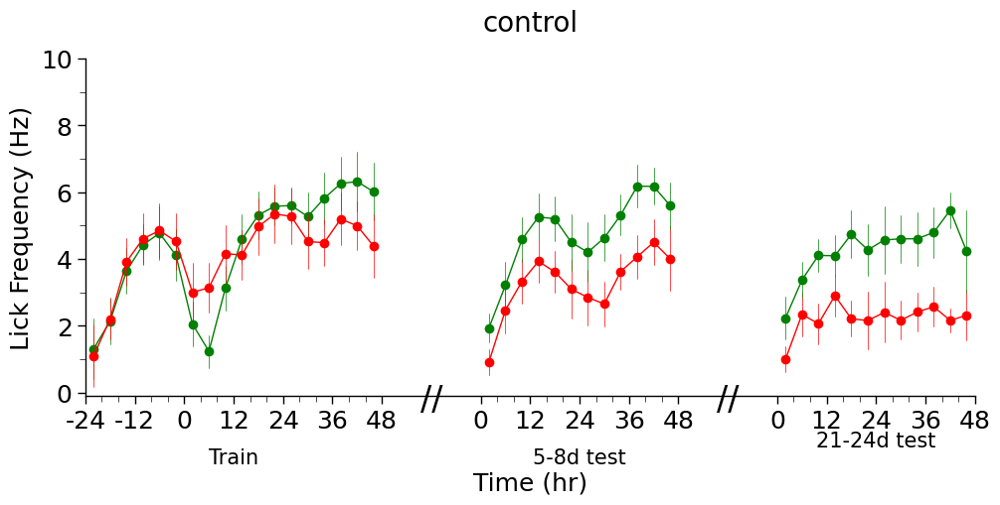

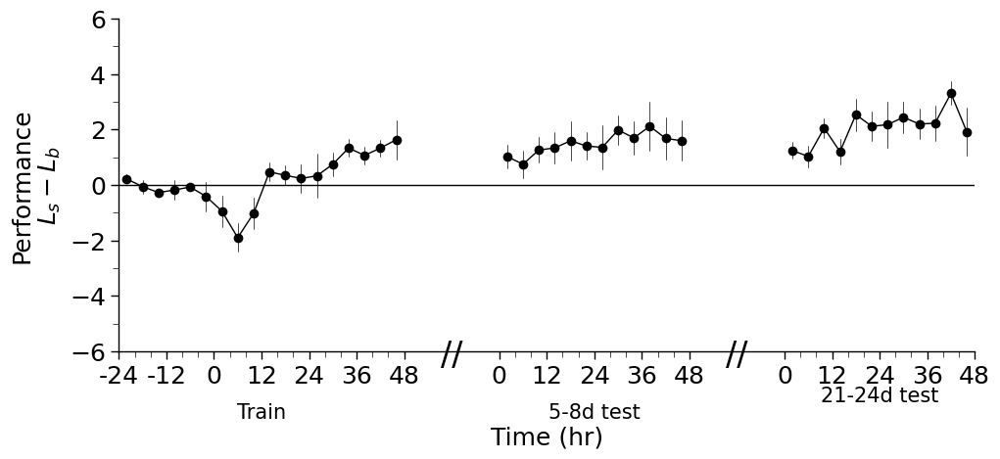

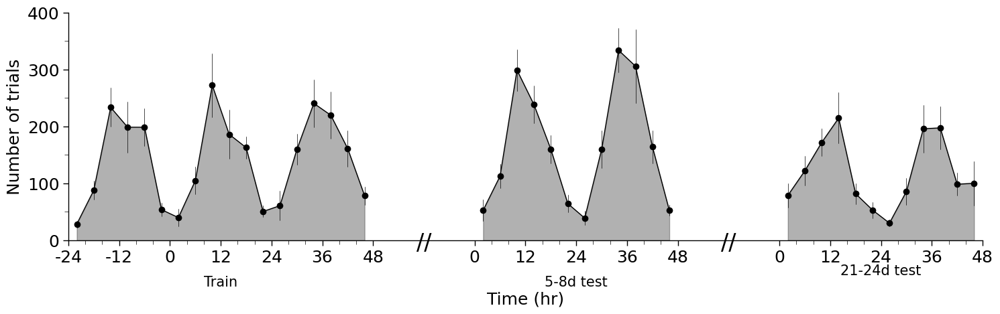

In [26]:
plot_retrain('control', ant_means_cond, ant_perf_cond, tots_cond, xlim, xticklab)

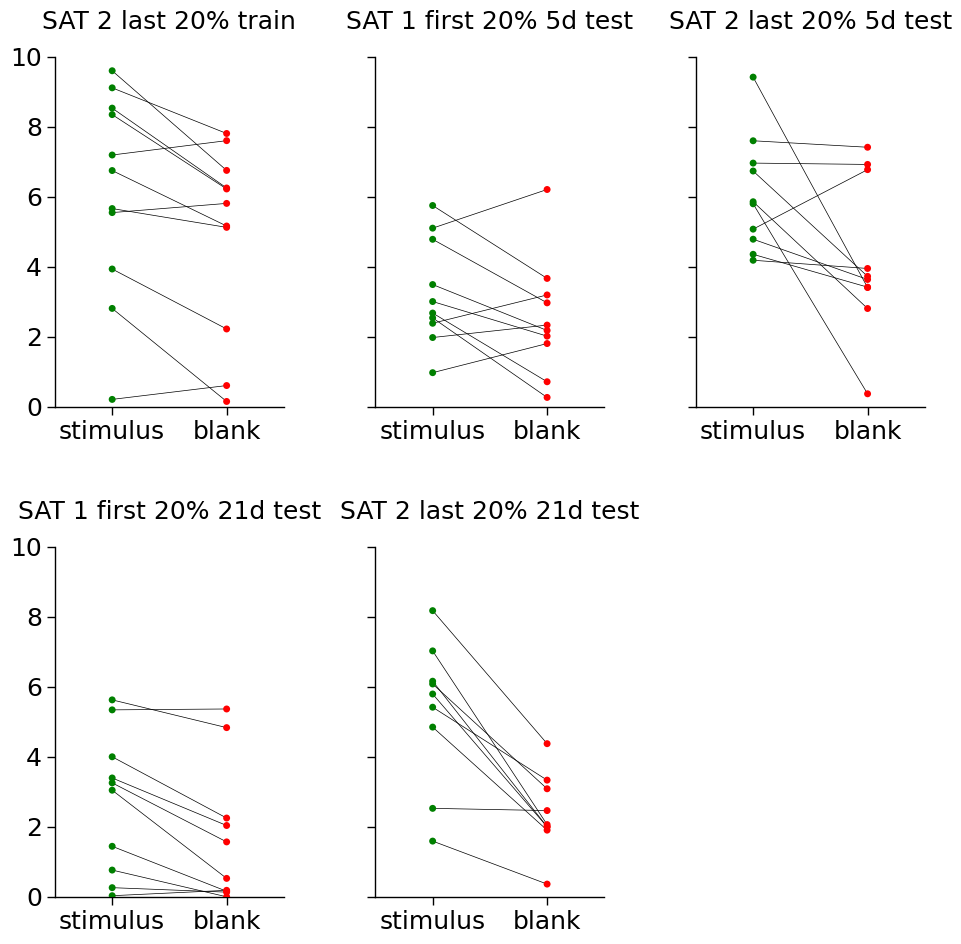

In [27]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
dayfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
cdfilt = dayfilt[dayfilt["cond"] == 'control']

g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                    hue="stimulus", palette=["green", "red"], col_wrap=3,
                    hue_order=["stimulus", "blank"],col_order=days,
                    col="daytimetest", jitter=False, aspect=0.65, legend=False, connect=True)
#g.fig.suptitle('control', y=1)
g.fig.subplots_adjust(wspace=0.4, hspace=0.4)

#### Lesioned animals learn task. Lesioned animals recall association after 5d and 21d break.

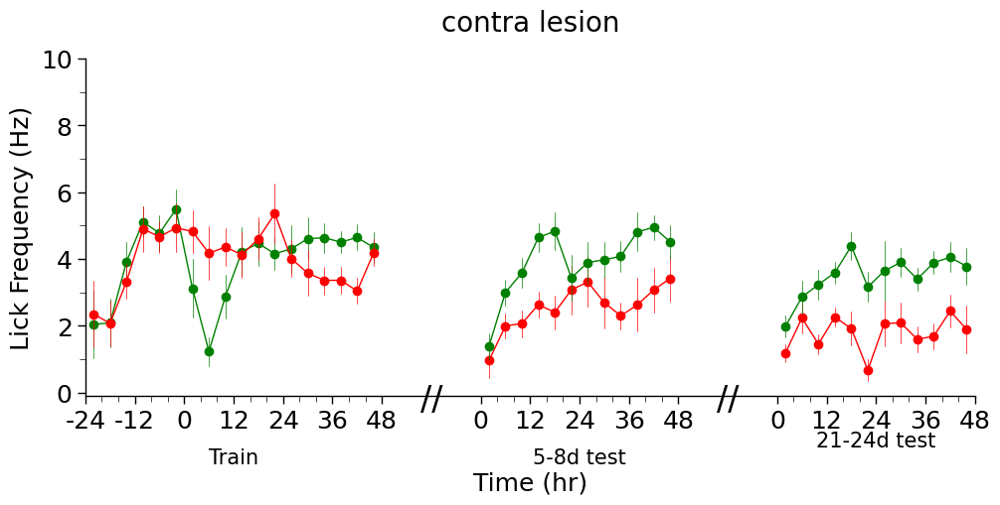

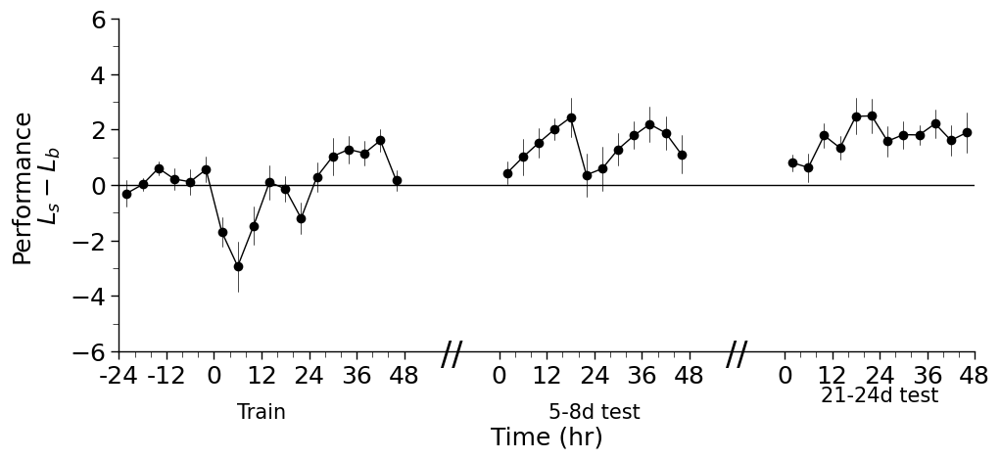

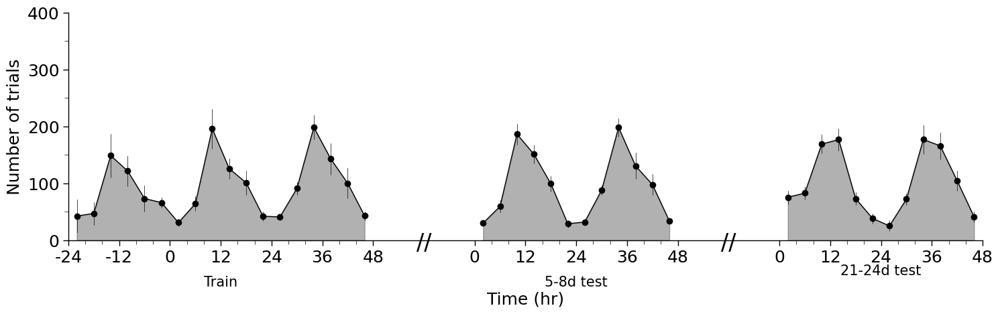

In [28]:
plot_retrain('contra lesion', ant_means_cond, ant_perf_cond, tots_cond,xlim, xticklab)

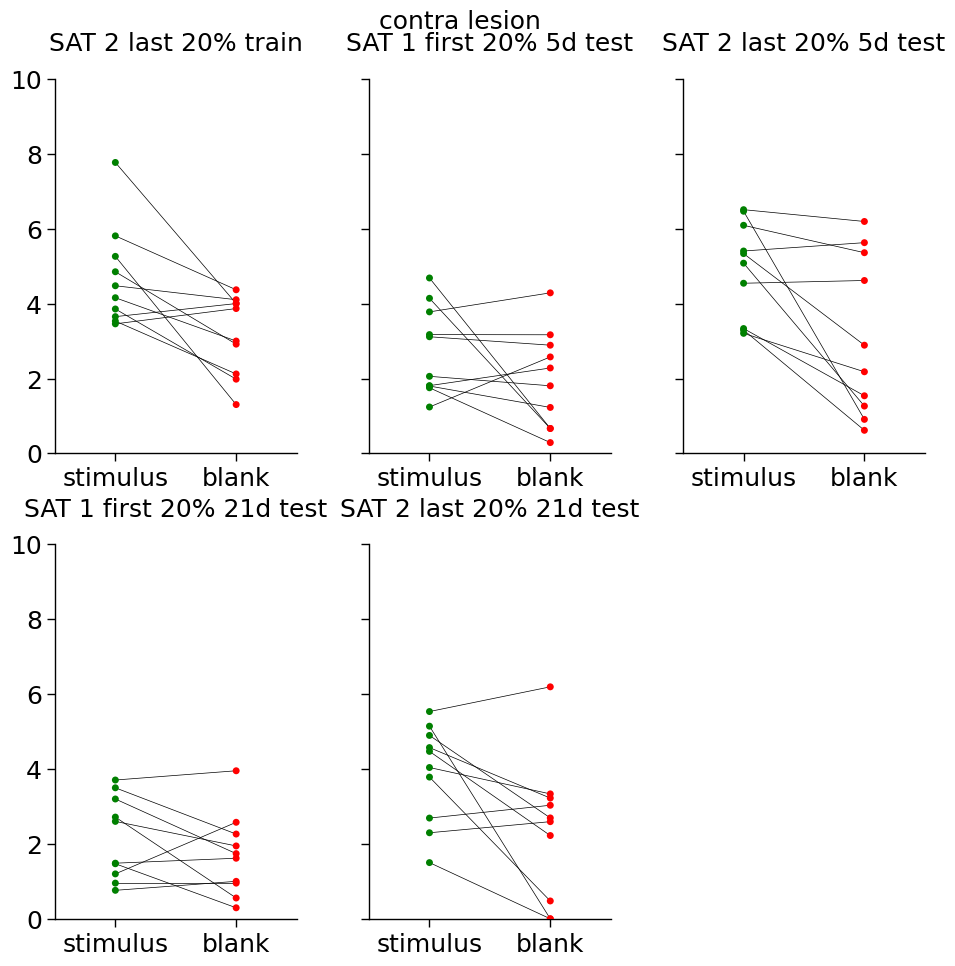

In [29]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
dayfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
cdfilt = dayfilt[dayfilt["cond"] == 'contra lesion']

g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                    hue="stimulus", palette=["green", "red"], col_wrap=3,
                    hue_order=["stimulus", "blank"],col_order=days,
                    col="daytimetest", jitter=False, aspect=0.65, legend=False, connect=True)
g.fig.suptitle('contra lesion', y=1)
#g.tight_layout()
g.fig.subplots_adjust(wspace=0.3)

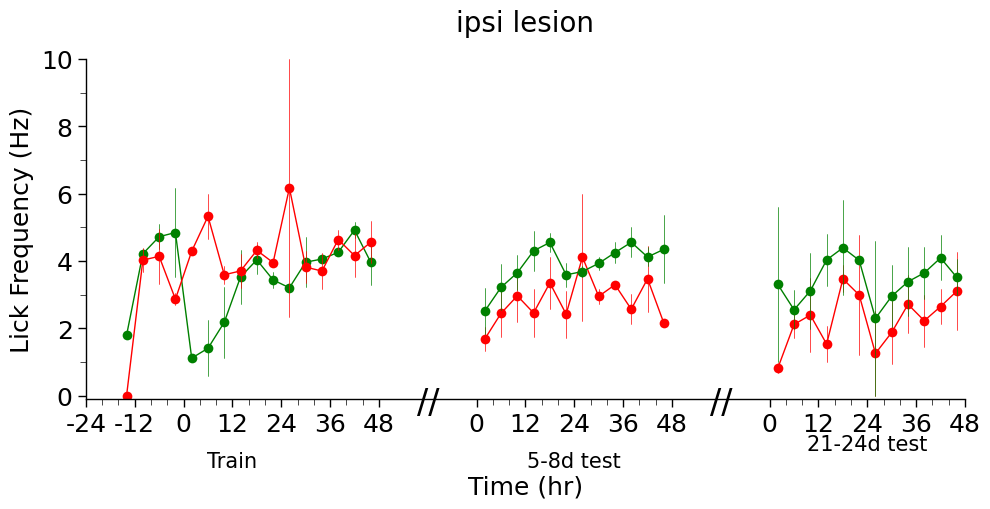

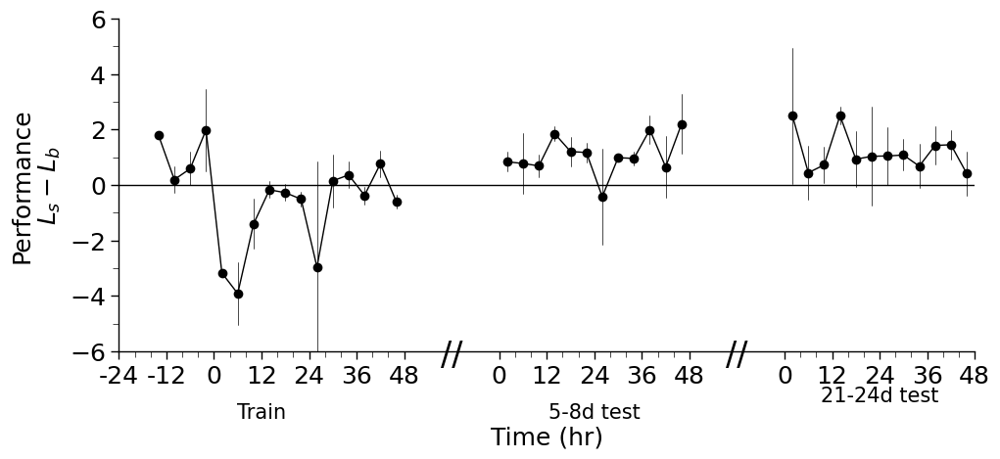

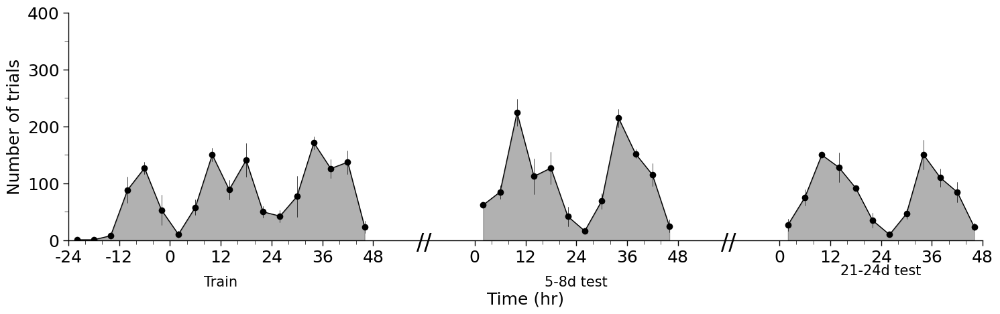

In [30]:
plot_retrain('ipsi lesion', ant_means_cond, ant_perf_cond, tots_cond,xlim, xticklab)

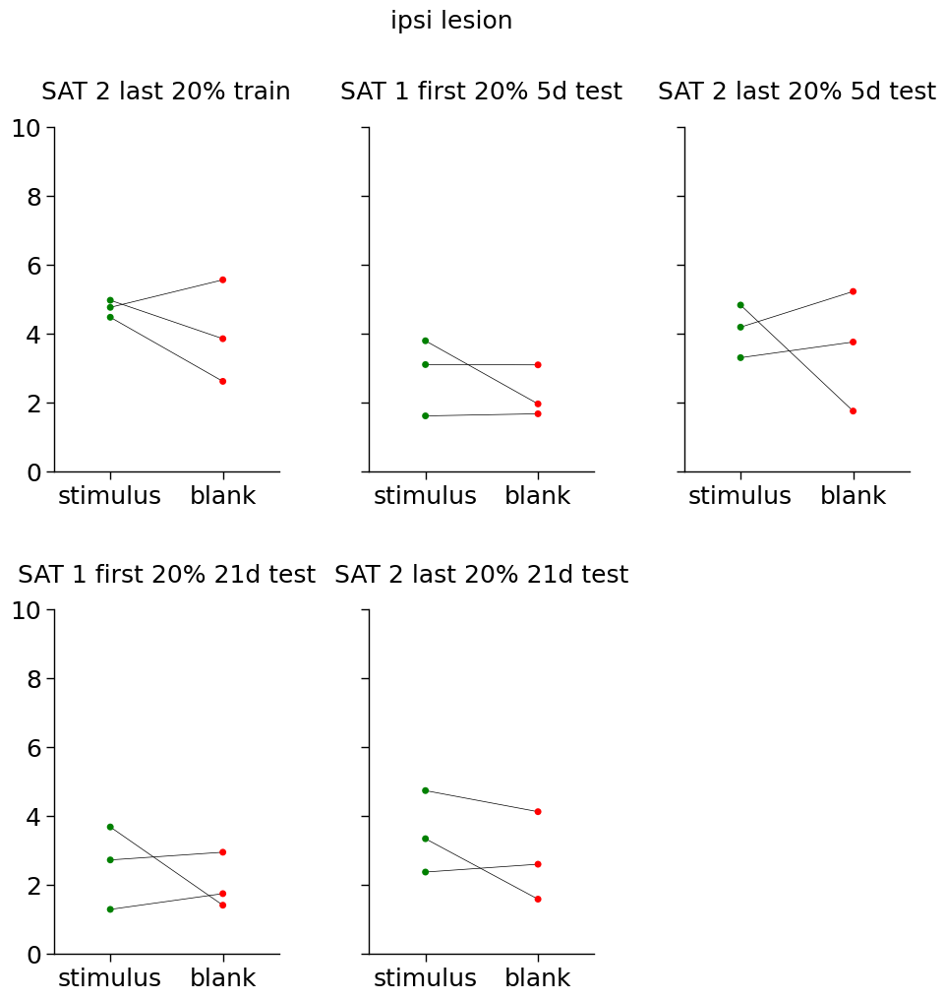

In [31]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
dayfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
cdfilt = dayfilt[dayfilt["cond"] == 'ipsi lesion']

g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                    hue="stimulus", palette=["green", "red"], col_wrap=3,
                    hue_order=["stimulus", "blank"],col_order=days,
                    col="daytimetest", jitter=False, aspect=0.65, legend=False, connect=True)
g.fig.suptitle('ipsi lesion', y=1.05)
#g.tight_layout()
g.fig.subplots_adjust(wspace=0.4, hspace=0.4)

#### Sham lesioned animals perform similarly to control animals

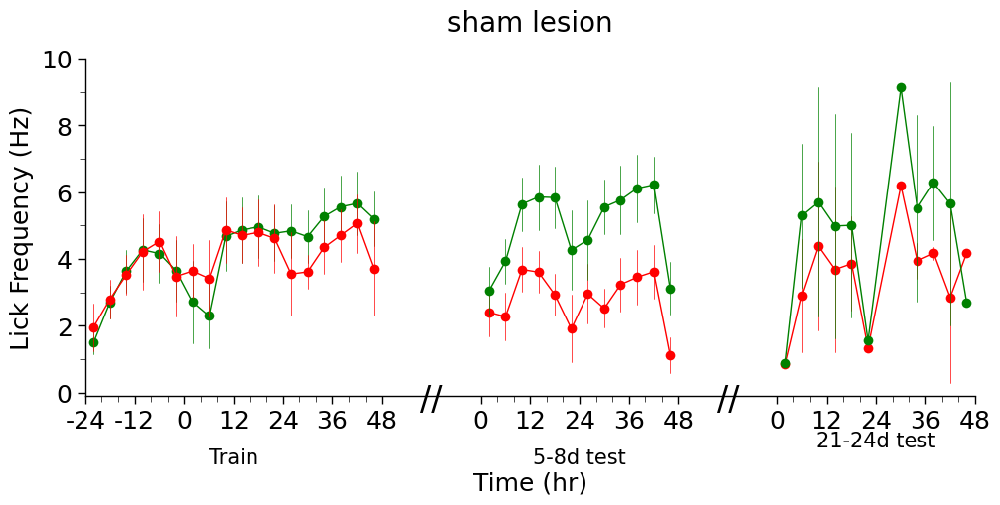

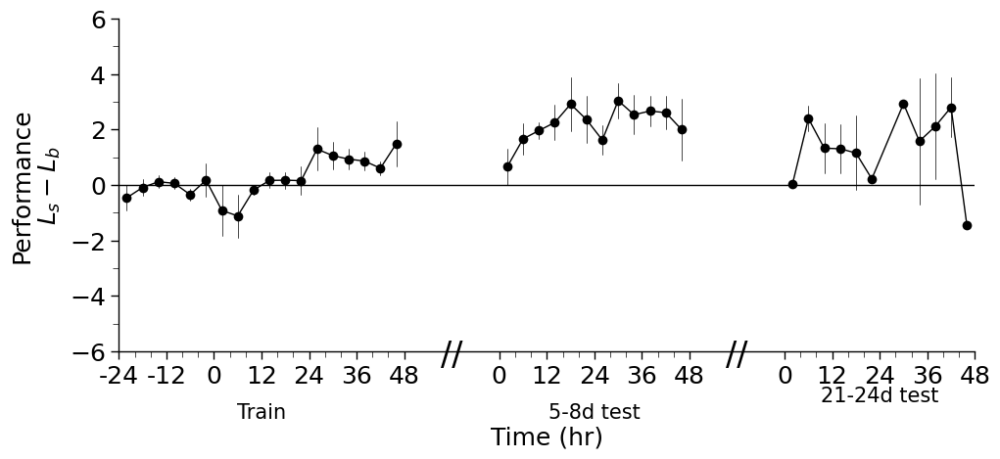

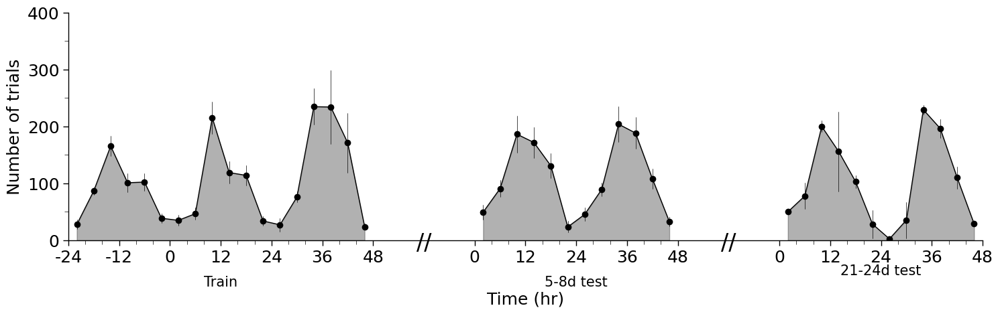

In [32]:
plot_retrain('sham lesion',ant_means_cond, ant_perf_cond, tots_cond, xlim, xticklab)

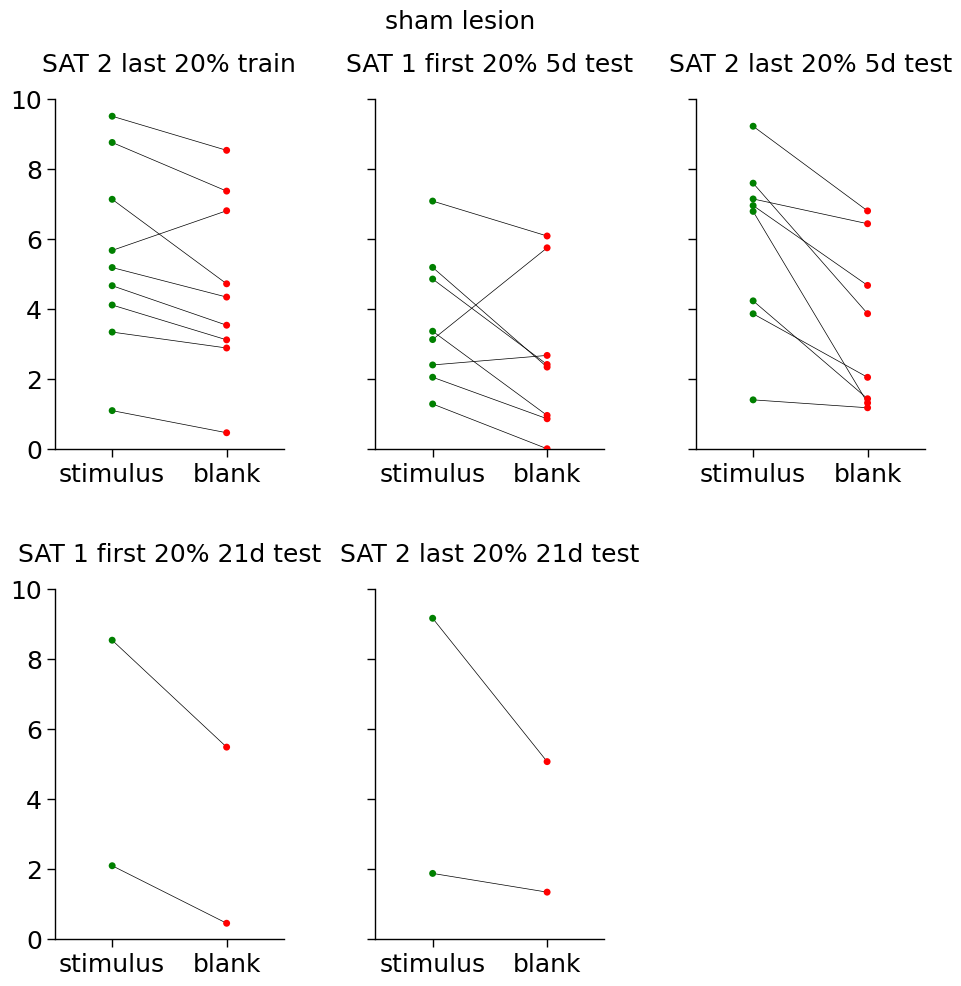

In [33]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
dayfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
cdfilt = dayfilt[dayfilt["cond"] == 'sham lesion']

g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                    hue="stimulus", palette=["green", "red"], col_wrap=3,
                    hue_order=["stimulus", "blank"],col_order=days,
                    col="daytimetest", jitter=False, aspect=0.65, legend=False, connect=True)
g.fig.suptitle('sham lesion', y=1.02)
#g.tight_layout()
g.fig.subplots_adjust(wspace=0.4, hspace=0.4)

#### Control and lesioned animals have similar performance

S1 barrel cortex is not required to learn or maintain sensory association

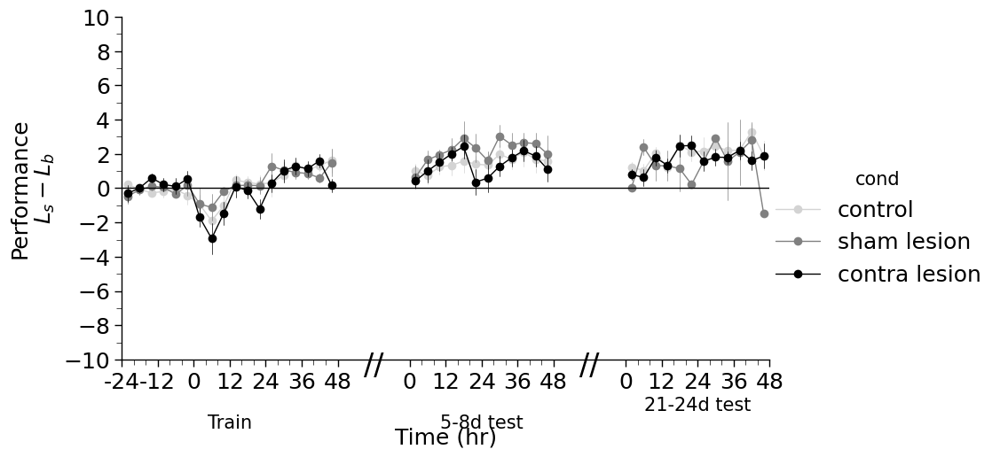

In [34]:
perf = ant_perf_cond

g = plot_ant_perf(perf[(perf['test_time'] == 'train')],
                        aspect=1.75,lw=1, ms=7,hue='cond', hue_order=['control', 'sham lesion','contra lesion'],
                        title='',xlim=xlim,col=None,legend=True, ylim=[-10, 10], 
                        errorbar='se', err_style='bars', err_kws={"lw":0.5},
                        wspace=0.25,palette=['lightgrey','grey', 'black'],)
sns.lineplot(perf[(perf['test_time'] == '5d test')],
            y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)', errorbar='se', hue='cond', hue_order=['control', 'sham lesion','contra lesion'],
            err_style='bars', err_kws={"lw":0.5}, mec=None, marker='o', 
            color='k', legend=False,palette=['lightgrey','grey', 'black'],)
sns.lineplot(perf[(perf['test_time'] == '21d test')],hue='cond', hue_order=['control', 'sham lesion','contra lesion'],
            y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)', errorbar='se', 
            err_style='bars', err_kws={"lw":0.5},color='k', mec=None, 
            marker='o', legend=False,palette=['lightgrey','grey', 'black'],)
style_retrain(g, xlim, [-10, 10], xticklab,'Time (hr)', "Performance\n$L_s - L_b$")

SAT 2 last 20% train
SAT 1 first 20% 5d test
SAT 2 last 20% 5d test
SAT 1 first 20% 21d test
SAT 2 last 20% 21d test


SAT 2 last 20% train
SAT 1 first 20% 5d test
SAT 2 last 20% 5d test
SAT 1 first 20% 21d test
SAT 2 last 20% 21d test


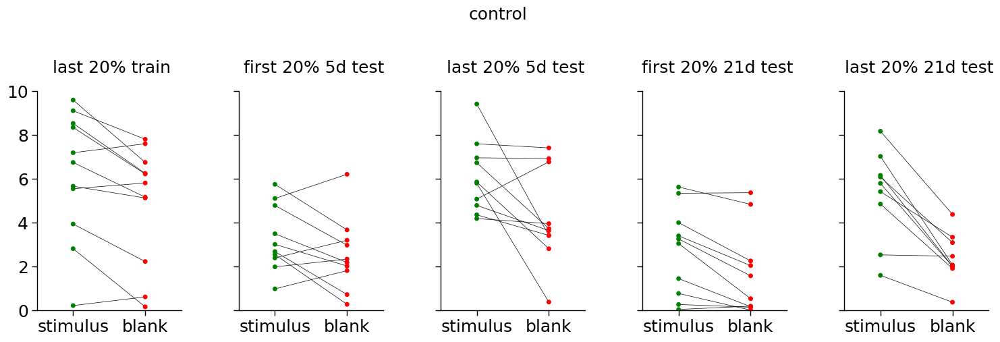

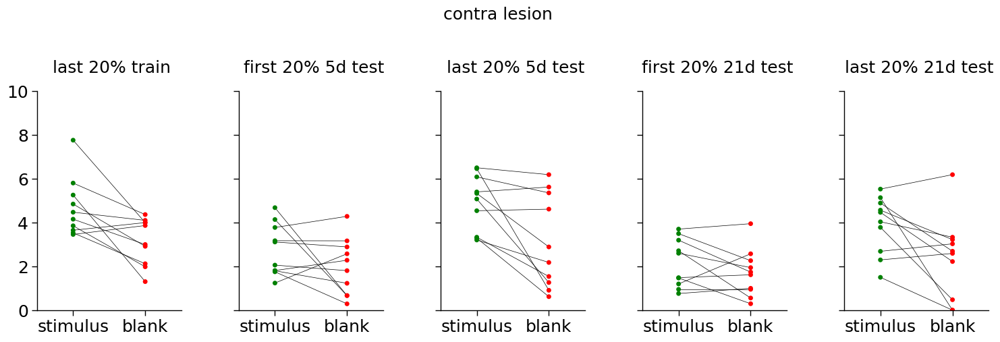

In [35]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
dayfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
for c in ['control', 'contra lesion']:
    cdfilt = dayfilt[dayfilt["cond"] == c]
    g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"],
                        hue_order=["stimulus", "blank"],col_order=days,
                        col="daytimetest", jitter=False, aspect=0.6, legend=False, connect=True)
    g.fig.suptitle(c, y=1.02)
    g.tight_layout()
    g.fig.subplots_adjust(wspace=0.4)
    for name, ax in g.axes_dict.items():
        print(name)
        ax.set_title(name.lstrip('SAT ').lstrip('12'))

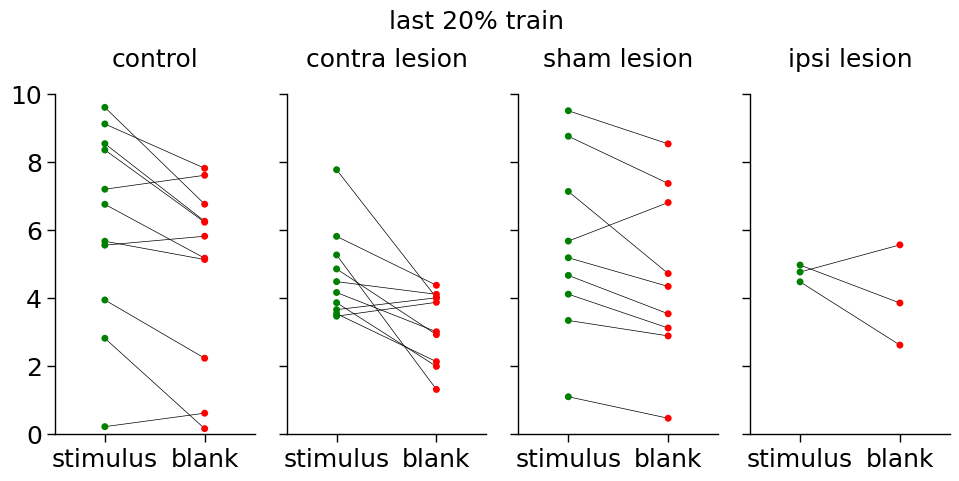

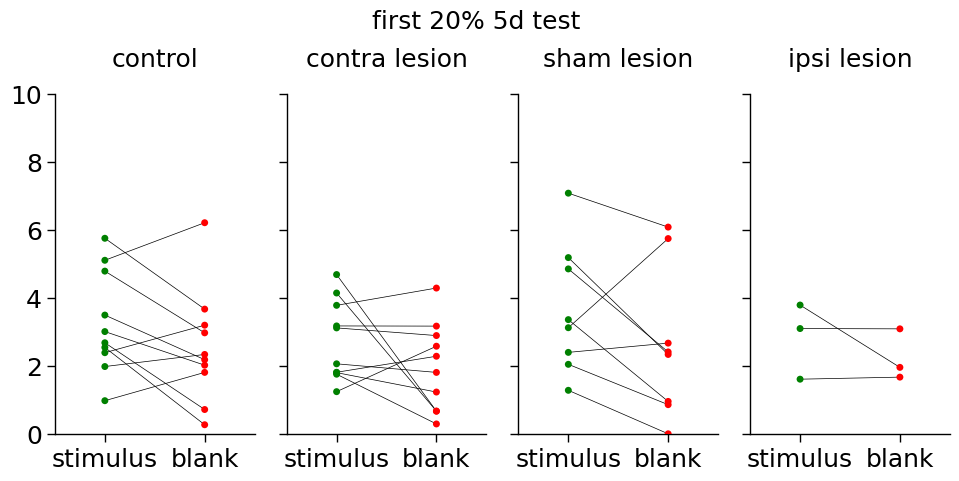

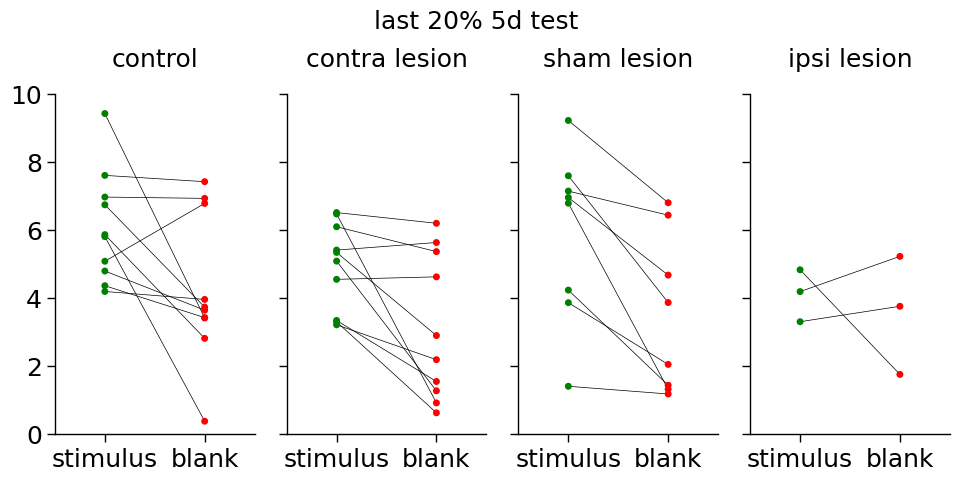

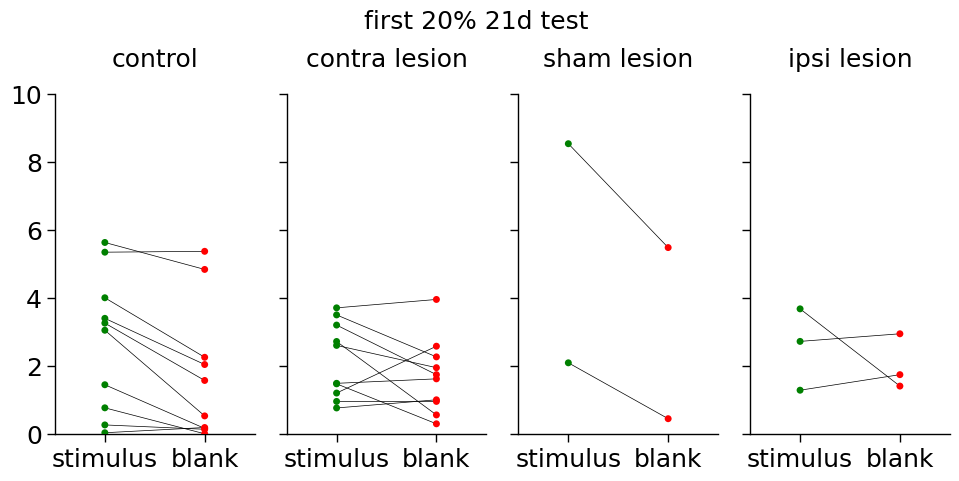

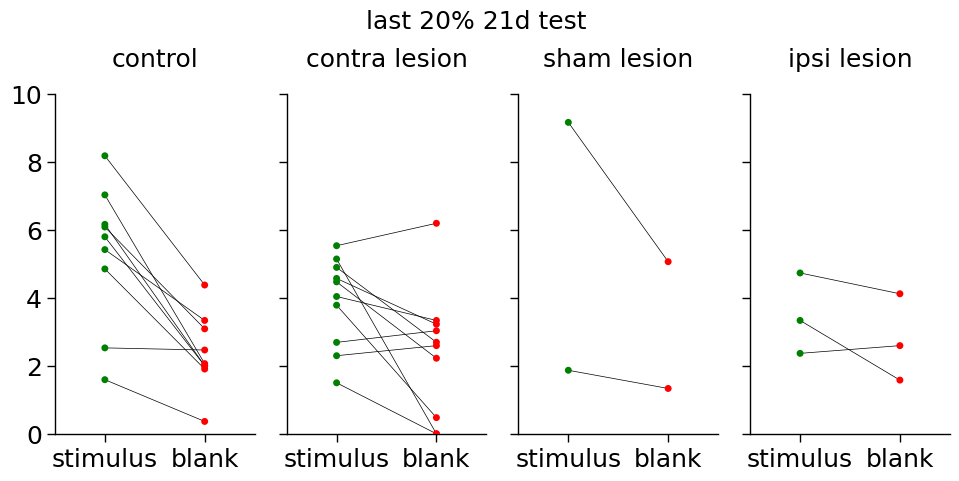

In [36]:
cdfilt = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)]
for day in days:
    dayfilt = cdfilt[cdfilt["daytimetest"] == day]
    g = plot_pair_strip(dayfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],col_order=conds,
                        col="cond", jitter=False, aspect=0.5, legend=False, connect=True)
    g.fig.suptitle(day.lstrip('SAT ').lstrip('12'), y=1.03)

Last + First 20% significance

In [37]:
res = []
firstlast20_means = firstlast20_means.sort_values(['condition', 'animal', 'daytimetest'])

stimcond = firstlast20_means["stimulus"] == "stimulus"
blankcond = firstlast20_means["stimulus"] == "blank"

conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
days = ['ACC 0 last 20% train', 'SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
filt = (firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))
ind = firstlast20_means[filt][["cond", "daytimetest"]].apply(tuple, axis=1).unique()

for c, day in ind:
    daycond = firstlast20_means["daytimetest"] == day
    ccond = firstlast20_means["cond"] == c
    #print(firstlast20_means[daycond])
    stim = firstlast20_means[stimcond & daycond & ccond]["lick"]
    san = firstlast20_means[stimcond & daycond & ccond][['animal',"lick"]]
    blank = firstlast20_means[blankcond & daycond & ccond]["lick"]
    ban = firstlast20_means[blankcond & daycond & ccond][['animal',"lick"]]
    #print(day, c,'stim', san,'blank', ban, '\n')
    res.append(stats.wilcoxon(stim, blank))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[0] + ", " + x[1]))

,statistic,pvalue
"contra lesion, SAT 1 first 20% 5d test",16.0,0.275391
"contra lesion, SAT 2 last 20% 5d test",3.0,0.009766
"contra lesion, SAT 1 first 20% 21d test",18.0,0.375000
"contra lesion, SAT 2 last 20% 21d test",6.0,0.027344
"contra lesion, SAT 2 last 20% train",4.0,0.013672
"contra lesion, ACC 0 last 20% train",17.0,0.570312
"control, SAT 1 first 20% 5d test",11.0,0.105469
"control, SAT 2 last 20% 5d test",6.0,0.027344
"control, SAT 1 first 20% 21d test",4.0,0.013672
"control, SAT 2 last 20% 21d test",0.0,0.003906


#### anticipatory lick frequency by animal

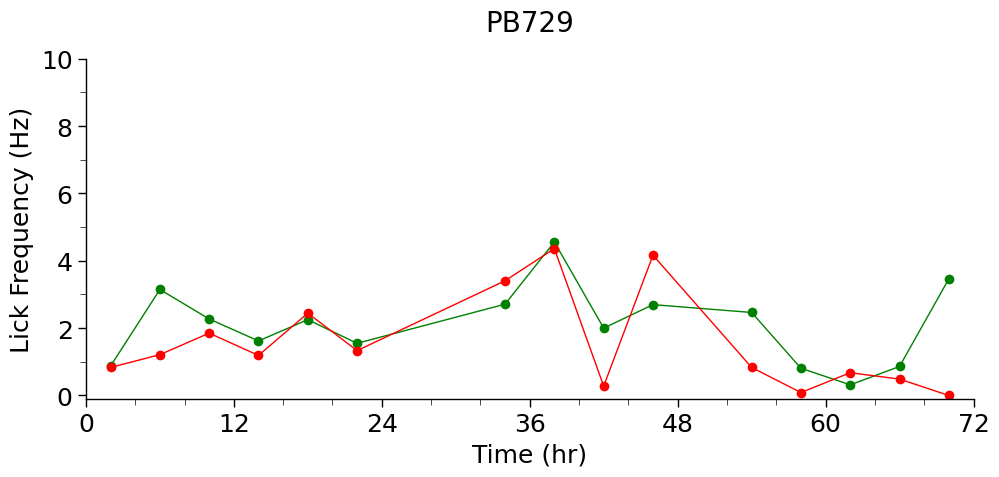

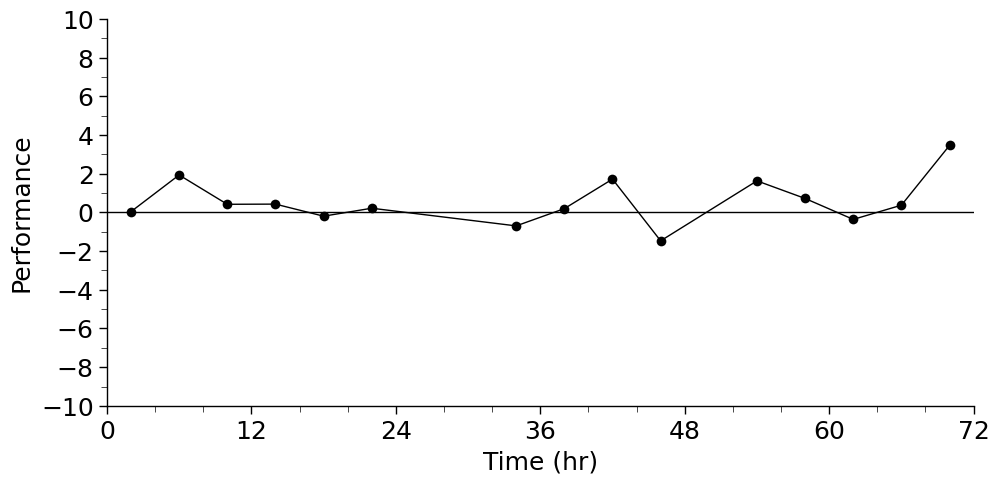

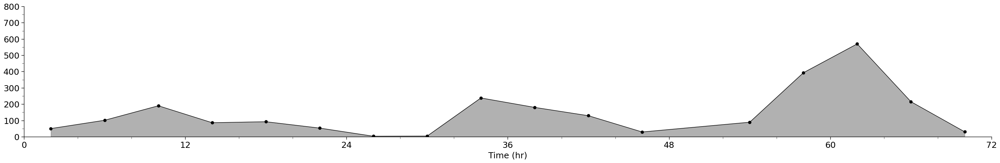

In [38]:
xlim=[0, 72]
for c in ant_means['test_time'].unique():
    if '21d test' in c:
        tmp = ant_means[ant_means['test_time'] == c]
        for a in tmp["animal"].unique():          
                if 'PB729' in a:
                        g = plot_ant_lickfreq(tmp[(tmp["animal"] == a)],y='lick',aspect=2,lw=1, ms=7, title=a,
                                legend=False, xlim=xlim, ylim=[-0.1, 10], errorbar='se', err_style='bars', err_kws={"lw":0.5})
                        g = plot_ant_perf(ant_perf[(ant_perf["animal"] == a) & (ant_perf['test_time'] == c)], ylabel="Performance", aspect=2,lw=1, ms=7,col=None,
                                        xlim=xlim, legend=False, ylim=[-10, 10], title='',errorbar='se', err_style='bars', err_kws={"lw":0.5})
                        g = plot_trial_hr(tots[(tots["animal"] == a) & (tots['test_time'] == c)], xlim=xlim, col=None,
                                        ylim=[0, 800], aspect=6, title='', ms=7, lw=1,err_kws={"lw":0.5}, ylabel='')

#### Initial performance after a 5d break is uncorrelated with last 20% performance 

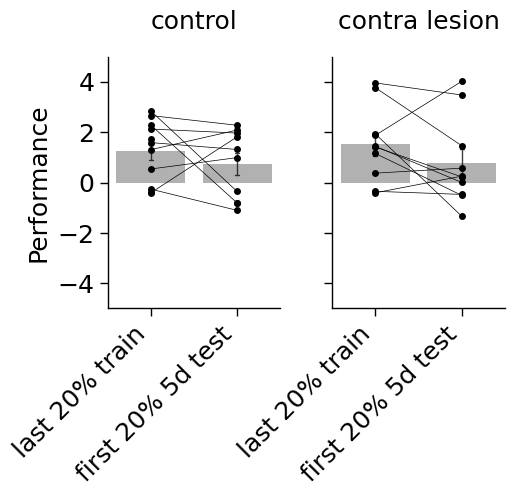

In [39]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test']# f'SAT 2 last 20% 5d test']#, f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion']#, 'sham lesion', 'ipsi lesion']
tmp = firstlast20_perf[firstlast20_perf.apply(lambda x: x["daytimetest"] in days, axis=1) & firstlast20_perf.apply(lambda x: x["cond"] in conds, axis=1)]
g = plot_bar_strip(tmp, x='daytimetest', y='lick', col='cond', linestyle='none',col_order=conds,order=days,
                errorbar='se',err_kws={'lw':1, 'zorder':0}, hue_order=days, ylim=[-5,5],color='k',pt_color='k',xlim=[-0.5,1.5],
                dodge=0.5, capsize=0.05, alpha=0.3, aspect=0.65, zorder=0.1, legend=True, connect=True,
                xlab_kws={'rotation':25, 'ha':'right'}, ylabel='Performance')
for name, ax in g.axes_dict.items():
    labs = ax.get_xticklabels()
    newlabs = []
    for l in labs:
        newlabs.append(l.get_text().lstrip('SAT ').lstrip('12'))
    ax.set_xticklabels(newlabs, rotation=45)
    g.fig.subplots_adjust(wspace=0.3)

In [40]:
def lin(x, a, b):
    return a*x + b

def plot_linregress(xdata, ydata, f, ax, xlim, ylim, title, xlab, ylab):
    res = stats.linregress(xdata, y=ydata)
    popt = (res.slope, res.intercept)
    ax.plot(xdata, ydata, 'ko')
    ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    f.legend(loc='upper right', bbox_to_anchor=(1.65, 0.9))
    print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))
    ax.set_title(title)

slope: 0.062, y-int: 0.820,R:0.05731, pval:0.884



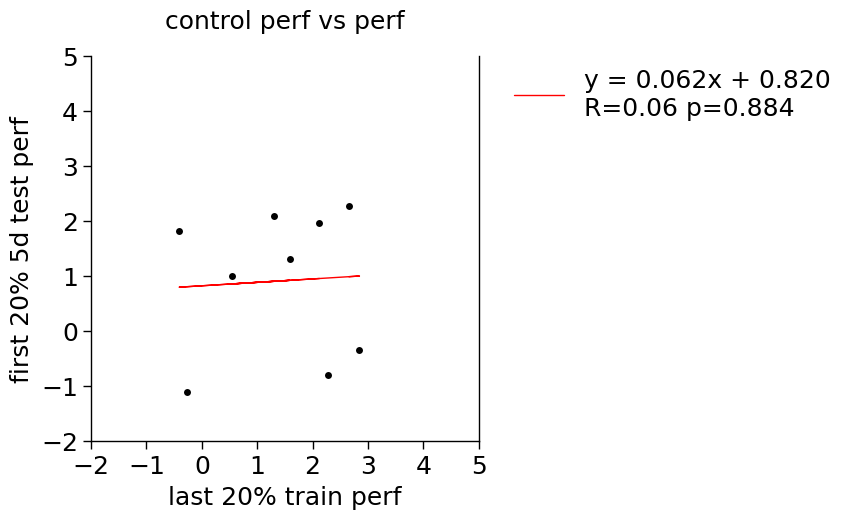

In [41]:
c = 'control'
regress = firstlast20_perf[(firstlast20_perf['cond'] == c) & (firstlast20_perf['animal'] != 'PB818') 
                         & (firstlast20_perf['animal'] != 'PB817') & (firstlast20_perf['animal'] != 'PVL1')
                         & (firstlast20_perf['animal'] != 'PVL2') & (firstlast20_perf['animal'] != 'PTE3')].sort_values(['animal', 'daytimetest'])
xdata = regress[regress['daytimetest'] == 'SAT 2 last 20% train']['lick']
ydata = regress[regress['daytimetest'] =='SAT 1 first 20% 5d test']['lick']
f, ax = plt.subplots(1,1, figsize=(5,5))
plot_linregress(xdata, ydata, 
                f, ax, [-2, 5], [-2,5], f'{c} perf vs perf', 'last 20% train perf', 'first 20% 5d test perf')

slope: 0.629, y-int: -0.184,R:0.53963, pval:0.107



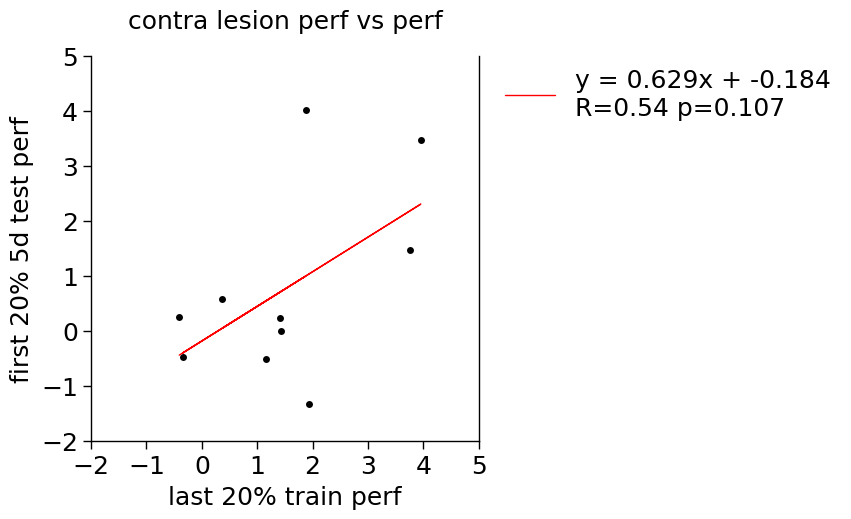

In [42]:
c = 'contra lesion'
regress = firstlast20_perf[(firstlast20_perf['cond'] == c) & (firstlast20_perf['animal'] != 'PB818') 
                         & (firstlast20_perf['animal'] != 'PB817') & (firstlast20_perf['animal'] != 'PVL1')
                         & (firstlast20_perf['animal'] != 'PVL2') & (firstlast20_perf['animal'] != 'PTE3')].sort_values(['animal', 'daytimetest'])
xdata = regress[regress['daytimetest'] == 'SAT 2 last 20% train']['lick']
ydata = regress[regress['daytimetest'] =='SAT 1 first 20% 5d test']['lick']
f, ax = plt.subplots(1,1, figsize=(5,5))
plot_linregress(xdata, ydata, 
                f, ax, [-2, 5], [-2,5], f'{c} perf vs perf', 'last 20% train perf', 'first 20% 5d test perf')

### Lick frequency heatmap analysis

In [44]:
def get_means(df, gpcols):
    means = df.groupby(gpcols)['lick'].mean()
    kpcols = df.columns.drop(gpcols + ['lick'])
    kp  = df.groupby(gpcols)[kpcols].first()
    means = pd.concat([means, kp], axis=1).reset_index()
    return means

In [45]:
def get_var(df, gpcols):
    means = df.groupby(gpcols)['lick'].var()
    kpcols = df.columns.drop(gpcols + ['lick'])
    kp  = df.groupby(gpcols)[kpcols].first()
    means = pd.concat([means, kp], axis=1).reset_index()
    return means

In [46]:
def get_sd(df, gpcols):
    means = df.groupby(gpcols)['lick'].std()
    kpcols = df.columns.drop(gpcols + ['lick'])
    kp  = df.groupby(gpcols)[kpcols].first()
    means = pd.concat([means, kp], axis=1).reset_index()
    return means

In [47]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)']
perf_full_sd = get_sd(perf_full, gpcols)
gpcols = gpcols + ['stimulus']
means_full_sd = get_sd(means_full, gpcols)

In [48]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)']
perf_full_means = get_means(perf_full, gpcols)
gpcols = gpcols + ['stimulus']
means_full_means = get_means(means_full, gpcols)

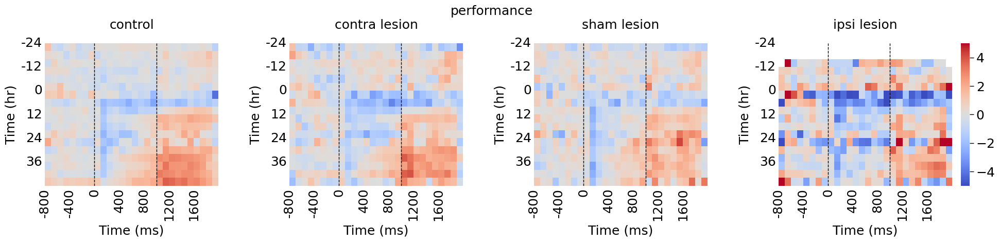

In [49]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = perf_full_means[(((perf_full_means['test_time'] == 'train') & (perf_full_means['Time (hr)'] >= -24))
                             | ((perf_full_means['test_time'].str.contains('test')) & (perf_full_means['Time (hr)'] >= 0)))
                             & (perf_full_means['Time (hr)'] < 48) 
                             & (perf_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (perf_full_means['Time (ms)'] < 2000)]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap,row='test_time', col='cond',
                row_order=['train'],#, '5d test', '21d test'],
                col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
                cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('performance', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 2000, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

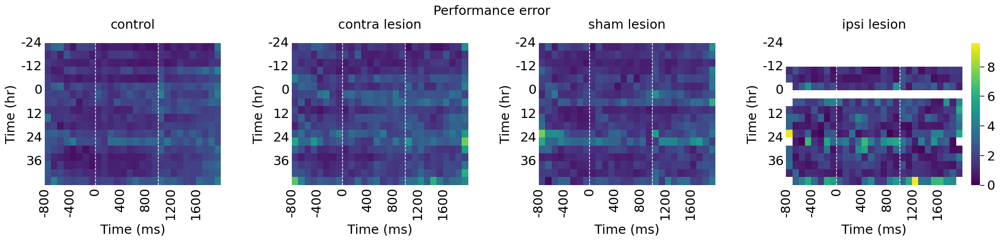

In [50]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = perf_full_sd[(perf_full_sd['Time (hr)'] >= -24) & (perf_full_sd['Time (hr)'] < 48) 
                             & (perf_full_sd.apply(lambda x: x['cond'] in conds, axis=1))
                             & (perf_full_sd['Time (ms)'] < 2000) 
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train'],#, '5d test', '21d test'],
                cmap='viridis', vmin=heatmap_data['lick'].min(), vmax=heatmap_data['lick'].max())
fg.suptitle('Performance error', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="white", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="white", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 1900, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

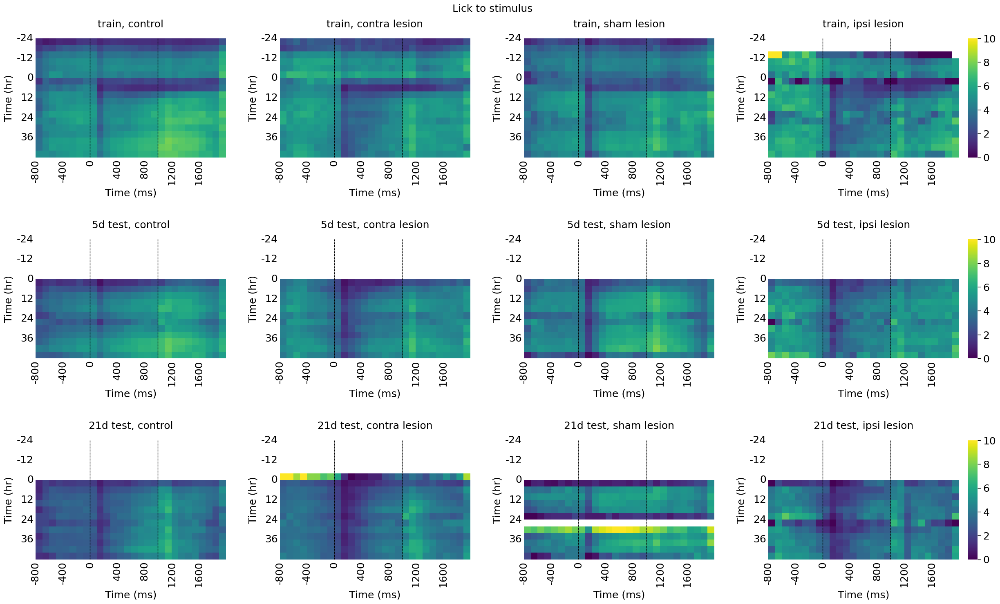

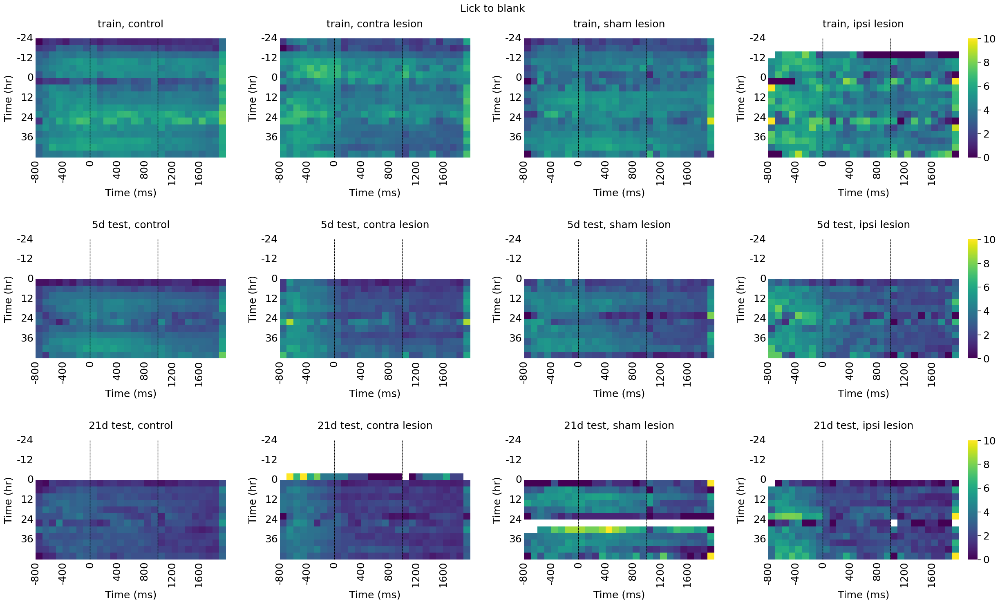

In [51]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train', '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 1900, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'blank'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train', '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to blank', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 1900, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

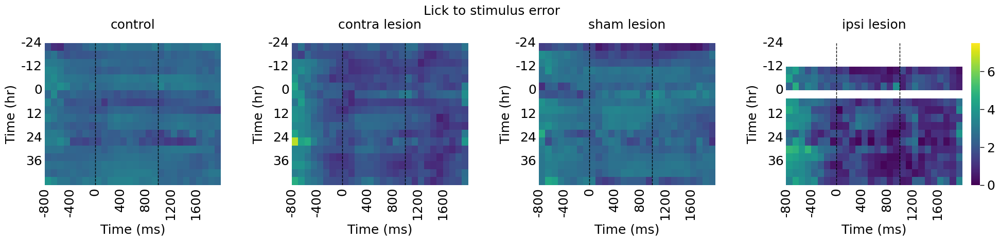

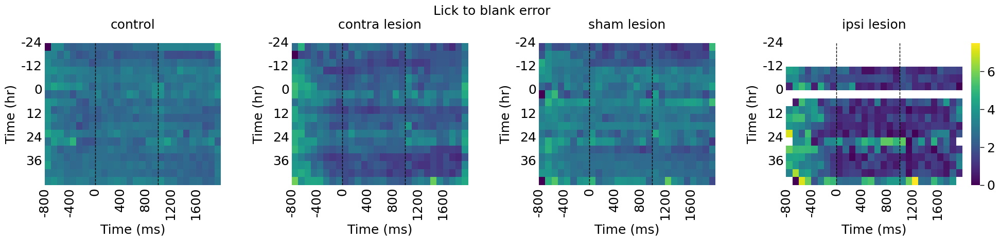

In [52]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_sd[(means_full_sd['Time (hr)'] >= -24) & (means_full_sd['Time (hr)'] < 48) 
                             & (means_full_sd.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_sd['Time (ms)'] < 2000) 
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train'],#, '5d test', '21d test'],
                cmap='viridis', vmin=heatmap_data['lick'].min(), vmax=heatmap_data['lick'].max())
fg.suptitle('Lick to stimulus error', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 1900, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'blank'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train'],#, '5d test', '21d test'],
                cmap='viridis', vmin=heatmap_data['lick'].min(), vmax=heatmap_data['lick'].max())
fg.suptitle('Lick to blank error', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 1900, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

### Control animals show greater consummatory licking in SAT than lesioned animals

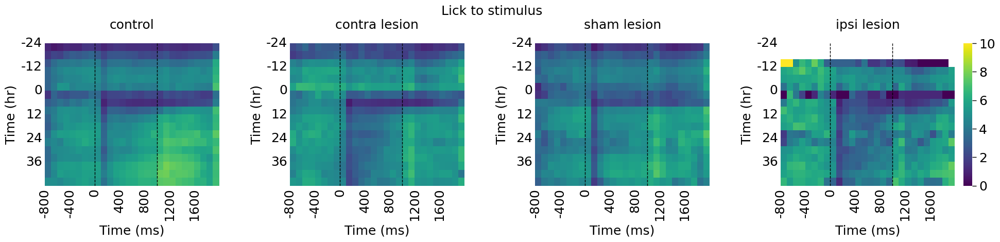

In [53]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train'],#, '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)
for ax in fg.axes:
    ax.axvline(x=8, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.axvline(x=18, ymin=0, ymax=1, ls="--", color="black", zorder=10, lw=1)
    ax.set_xticks(range(0, len(range(-800, 2000, 100)), 4), labels=range(-800, 2000, 400),)
    ax.set_yticks(range(0, len(range(-24, 48, 4)), 3), labels=range(-24, 48, 12),)
    ax.tick_params(axis='both', which='both', length=0)

#### Anticipatory and consummatory licking of contra lesioned animals is lower at SAT2

In [235]:
def get_time_group(x):
    if x in range(-500, -300, 100):
        return 'baseline'
    elif x in range(700, 1000, 100):
        return 'anticipatory'
    elif x in range(1100, 1400, 100):
        return 'consummatory'
def get_bin_group(x):
    if x in [-12, -8, -4]:
        return 'ACC'
    elif x in [4, 8, 12]:
        return 'SAT1'
    elif x in [32, 36, 40, 44]:
        return 'SAT2'

In [59]:
 mins = {
        "min_trials": 10,  # minimum number of trials in a bin to keep
        "min_blank": 1,   # minimum number of water trials
        "min_stimulus": 1 # minimum number of water trials 
        }
keep = ['Strain', 'Age', 'Cage', 'Date', 'Day', 'test_time', 'cond', 'stimulus', 'water', 'type', 'trial no']

In [60]:
output = run_analysis(data, 'bin', 
                        keys, mins, keep, ['lick'], ['condition', 'animal'], [(1100, 1400), 4*60])

KeyError: "None of ['trial no'] are in the columns"

In [244]:
cons_last_20  = get_nth_part_day(means_subset[means_subset['time (ms) group'] == 'consummatory'], 5, 1)
cons_last_20

KeyError: 'condition'

In [238]:
means_full['time (ms) group'] = means_full['Time (ms)'].apply(get_time_group)
means_full['time (hr) group'] = means_full['Time (hr)'].apply(get_bin_group)
means_subset = means_full.groupby(['cond', 'test_time','animal', 'stimulus', 'time (ms) group', 'time (hr) group'])['lick'].mean().reset_index()
means_subset

,cond,test_time,animal,stimulus,time (ms) group,time (hr) group,lick
0,100ACC80ACC,train,PNL1,blank,anticipatory,ACC,5.552170
1,100ACC80ACC,train,PNL1,blank,anticipatory,SAT1,4.906603
2,100ACC80ACC,train,PNL1,blank,baseline,ACC,3.568644
3,100ACC80ACC,train,PNL1,blank,baseline,SAT1,4.143281
4,100ACC80ACC,train,PNL1,blank,consummatory,ACC,5.214153
...,...,...,...,...,...,...,...
3883,sham lesion,train,PWH9,stimulus,baseline,SAT1,1.088805
3884,sham lesion,train,PWH9,stimulus,baseline,SAT2,2.655206
3885,sham lesion,train,PWH9,stimulus,consummatory,ACC,1.062402
3886,sham lesion,train,PWH9,stimulus,consummatory,SAT1,2.545934


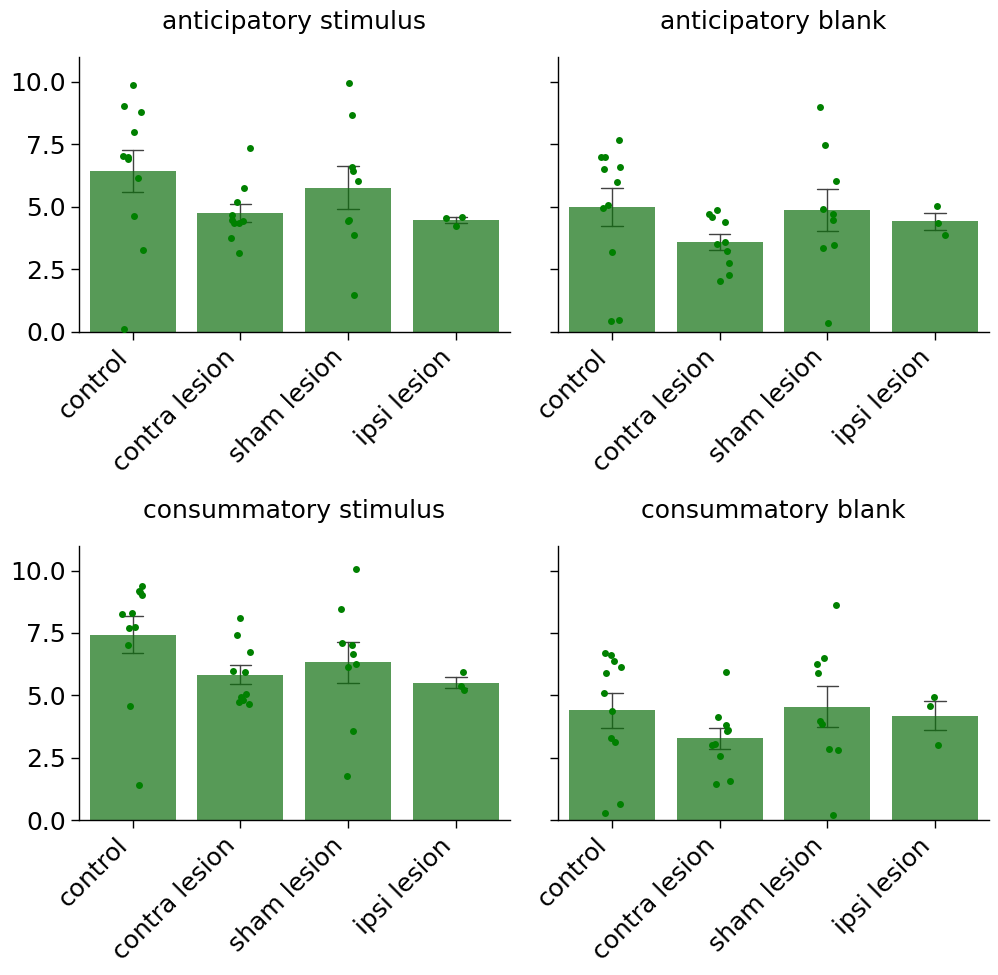

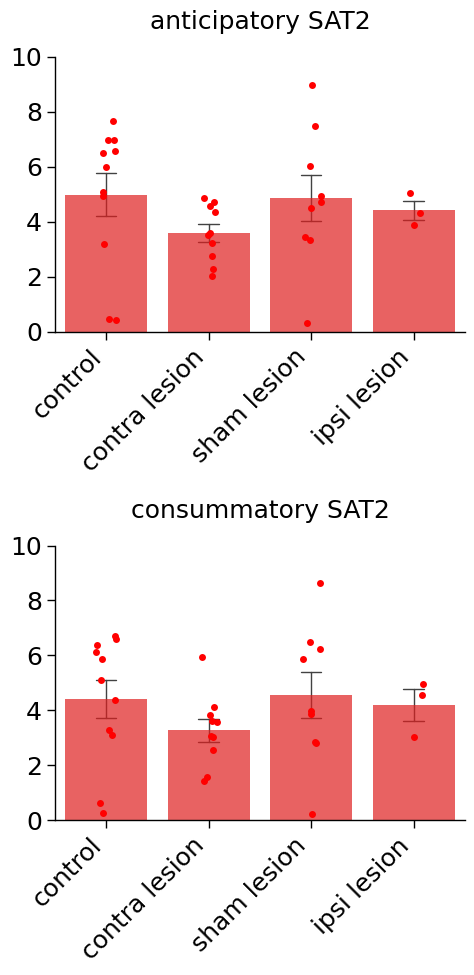

In [242]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['time (hr) group'] =='SAT2')], 
                col_order=['stimulus', 'blank'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='stimulus', row='time (ms) group', hue='stimulus', hue_order=['stimulus', 'blank'],
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green', ylim=[0, 11])

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

#### Lower licking frequency of contra lesioned animals is not due to lower overall licking frequency

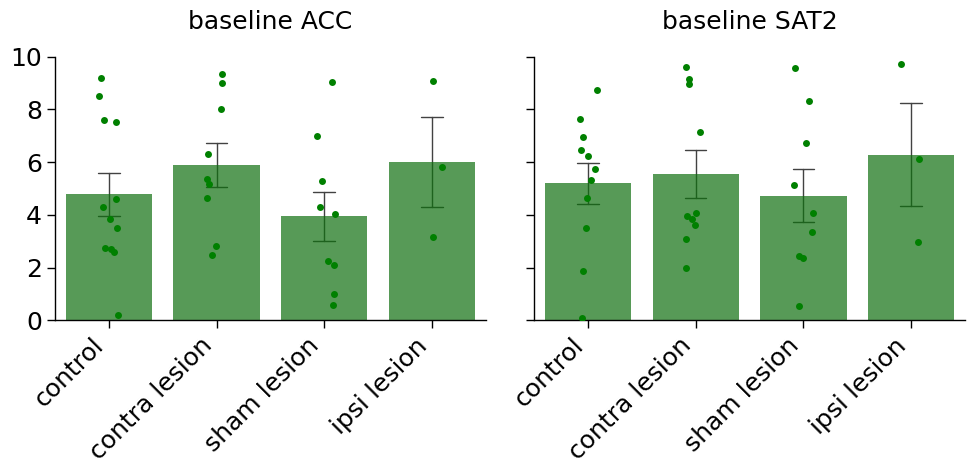

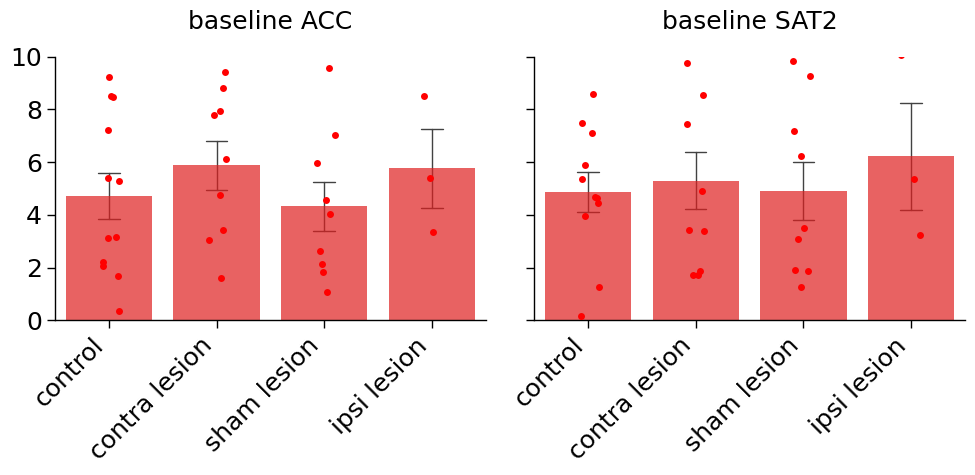

In [ ]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='stimulus')], 
                col_order=['ACC', 'SAT2'], row_order=['baseline'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green')

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['ACC', 'SAT2'], row_order=['baseline'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

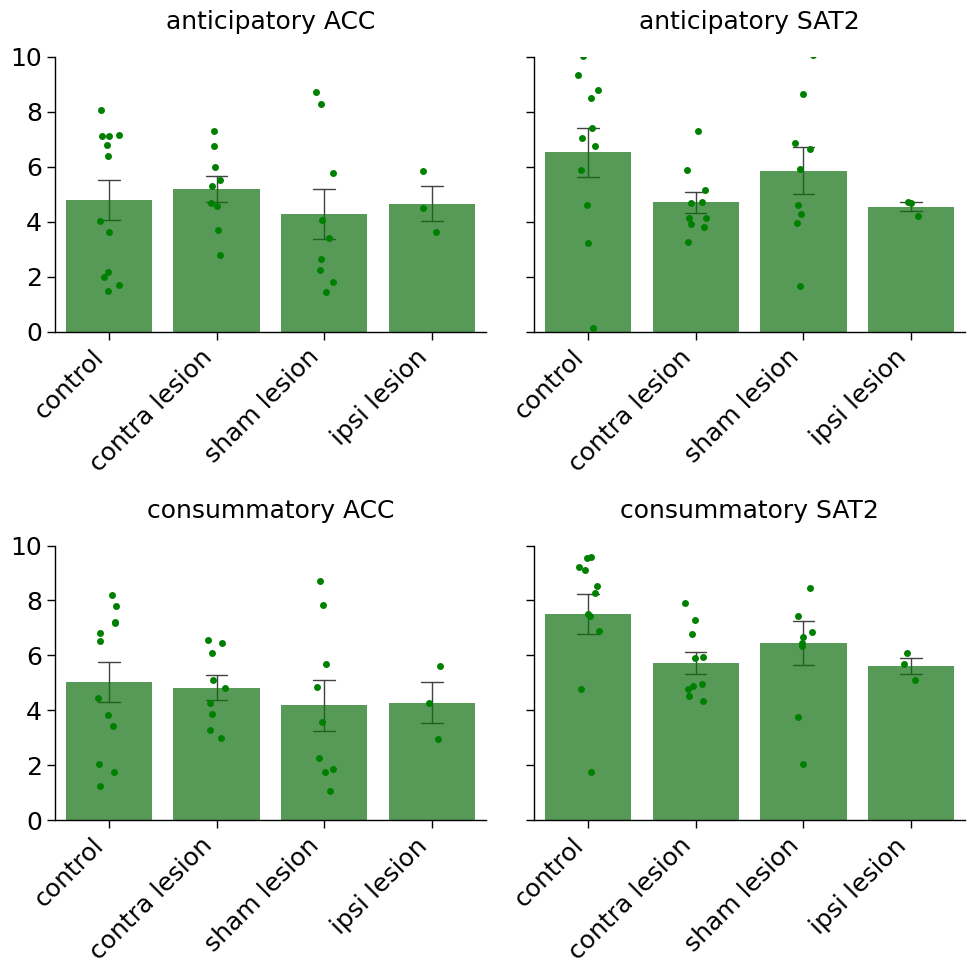

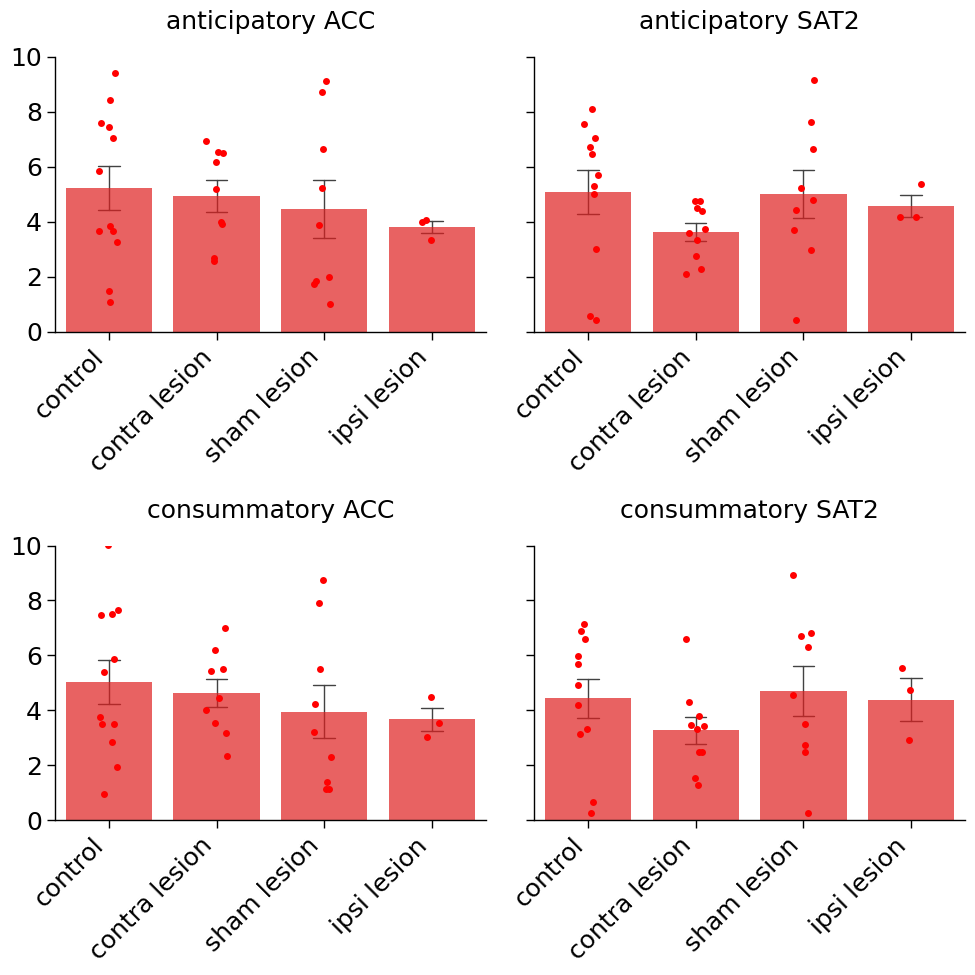

In [ ]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='stimulus')], 
                col_order=['ACC', 'SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green')

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['ACC', 'SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

#### Lower licking  frequency of contra lesioned animals is due to failure to recover licking frequency after air puff

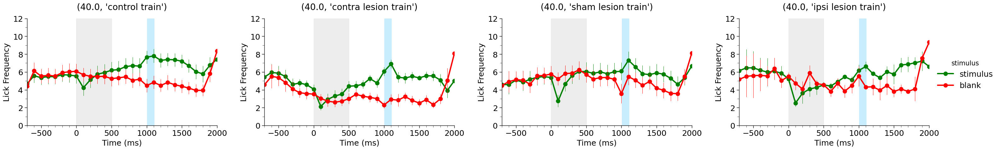

In [ ]:
plot_lickfreq(means_full[(means_full.apply(lambda x: x['cond'] in conds, axis=1)) &
                         (means_full['Time (hr)'] == 40)
                       & (means_full['test_time'] == 'train')
                        ], col_order=['control train', 'contra lesion train', 'sham lesion train', 'ipsi lesion train'],
                        suptitle=None, col='condition', col_wrap=None, row='Time (hr)',errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-700, 2000])

#### Decreasing lick pre-puff lick frequency is not present in old dataset of lesioned animals

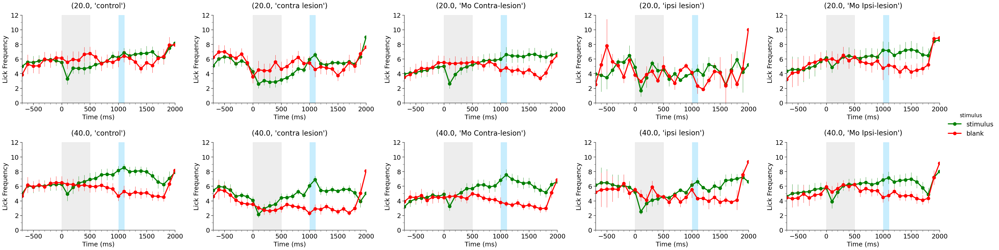

In [ ]:
conds = ['control', 'contra lesion', 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion']
plot_lickfreq(means_full[(means_full.apply(lambda x: x['cond'] in conds, axis=1)) &
                         ((means_full['Time (hr)'] == 40) | (means_full['Time (hr)'] == 20))
                       & (means_full['test_time'] == 'train')
                        ], col_order=['control', 'contra lesion', 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion'],
                        suptitle=None, col='cond', col_wrap=None, row='Time (hr)',errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-700, 2000])

### last and first 20% of trials

#### plotting


In [544]:
filt = firstlast20_perf[(firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_perf['daytimetest'] == days[0])]
tot = filt.groupby('cond')['lick'].count()
learned = filt[(filt['lick'] > 0.5)].groupby('cond')['lick'].count()
ans = filt[(filt['lick'] > 0.5)]['animal']
ans = list(ans)
recallfilt = firstlast20_perf[(firstlast20_perf.apply(lambda x: x['daytimetest'] == days[1], axis=1)) & (firstlast20_perf.apply(lambda x: x['animal'] in ans, axis=1))]
recall = recallfilt[(recallfilt['lick'] > 0.5)].groupby('cond')['lick'].count()

In [545]:
learned/tot

cond
contra lesion    0.700000
control          0.727273
ipsi lesion      0.666667
sham lesion      0.777778
Name: lick, dtype: float64

In [546]:
(recall/tot).fillna(0)

cond
contra lesion    0.300000
control          0.454545
ipsi lesion      0.000000
sham lesion      0.666667
Name: lick, dtype: float64

In [540]:
filt = firstlast20_perf[(firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_perf['daytimetest'] == days[2])]
tot = filt.groupby('cond')['lick'].count()
learned = filt[(filt['lick'] > 0.5)].groupby('cond')['lick'].count()
ans = filt[(filt['lick'] > 0.5)]['animal']
ans = list(ans)
recallfilt = firstlast20_perf[(firstlast20_perf.apply(lambda x: x['daytimetest'] == days[3], axis=1)) & (firstlast20_perf.apply(lambda x: x['animal'] in ans, axis=1))]
recall = recallfilt[(recallfilt['lick'] > 0.5)].groupby('cond')['lick'].count()

In [541]:
learned/tot

cond
contra lesion    0.700000
control          0.600000
ipsi lesion      0.333333
sham lesion      0.875000
Name: lick, dtype: float64

In [543]:
recall/tot

cond
contra lesion    0.300000
control          0.400000
ipsi lesion      0.333333
sham lesion           NaN
Name: lick, dtype: float64

In [ ]:
f, ax = plt.subplots(1,1, figsize=(5,5))
regress = last20_filt[['an', 'lick', 'droplet size']].dropna().sort_values('droplet size')

xdata = regress['droplet size']
ydata = regress['lick']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
#sns.scatterplot(last20_filt, x='droplet size',y='trial no', hue='cond', ax=ax, legend=True)
ax.plot(xdata, ydata, 'ko')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('SAT last 20% lick freq')
#ax.get_legend().set_visible(False)
ax.set_ylim([0, 10])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.65, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))

In [456]:
first20['time'] = 'first 20%'
last20_data['time'] = 'last 20%'
firstlast20 = pd.concat([first20, last20_data])
format_all(firstlast20)
firstlast20['Day_label'] = firstlast20["Day"].apply(day_to_label)
firstlast20['daytime'] = firstlast20['Day_label'] + ' ' + firstlast20['time']
firstlast20['daytimetest'] = firstlast20['daytime'] + ' ' + firstlast20['test_time']
firstlast20['animal'] = firstlast20['animal'].str.rstrip('reaints')

#### Learining by animal (lick to stimulus is significantly different from lick to blank)

First and Last 20% of trials

In [477]:
res = []
firstlast20 = firstlast20.sort_values(['condition', 'animal', 'daytimetest'])

stimcond = firstlast20["stimulus"] == "stimulus"
blankcond = firstlast20["stimulus"] == "blank"

conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
filt = (firstlast20.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20.apply(lambda x: x['daytimetest'] in days, axis=1))
ind = firstlast20[filt][["cond", "animal", 'Day_label', 'time', 'test_time']].apply(tuple, axis=1).unique()

for c, an, day, time, test in ind:
    daycond = firstlast20["daytimetest"] == day + ' ' + time + ' ' + test
    ccond = firstlast20["cond"] == c
    ancond = firstlast20['animal'] == an
    stim = firstlast20[stimcond & daycond & ccond & ancond]["lick"]
    blank = firstlast20[blankcond & daycond & ccond & ancond]["lick"]
    if len(stim) > 0 and len(blank) > 0:
        res.append(stats.mannwhitneyu(stim, blank))
    else:
        res.append([np.NaN, np.NaN])

out = pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.MultiIndex.from_tuples(ind, name=['cond', 'animal', 'day', 'time', 'test_time']))
out.to_clipboard()
out

statistic        pvalue
cond          animal day   time      test_time                         
contra lesion PB715  SAT 1 first 20% 5d test       1505.5  4.239739e-01
                     SAT 2 last 20%  5d test       1047.5  3.230136e-02
              PB716  SAT 1 first 20% 5d test        494.5  7.135866e-01
                     SAT 2 last 20%  5d test        463.5  6.707810e-01
              PB727  SAT 1 first 20% 5d test       2918.0  7.882078e-07
...                                                   ...           ...
sham lesion   PWH4   SAT 2 last 20%  train         1647.0  8.515224e-03
              PWH5   SAT 2 last 20%  train          891.0  4.754029e-01
              PWH6   SAT 2 last 20%  train          824.0  1.696724e-01
              PWH7   SAT 2 last 20%  train         2226.5  2.723347e-01
              PWH9   SAT 2 last 20%  train          600.0  3.154743e-01

[141 rows x 2 columns]

In [478]:
htmp_out = out['pvalue'].unstack(level=['test_time'])[['train', '5d test', '21d test']].sort_values(['cond', 'animal','day', 'time']).unstack(level=['day', 'time'])

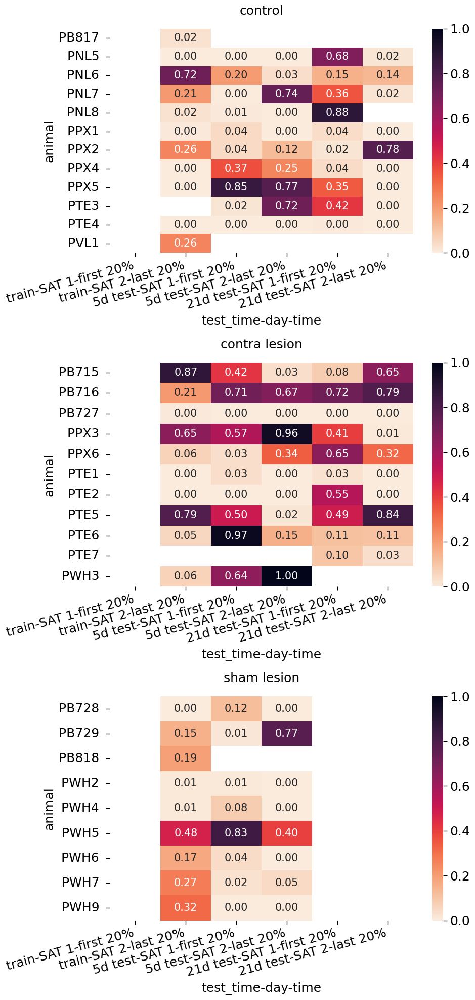

In [491]:
fg, ax = plt.subplots(3, 1, figsize=(10,20))
#cax = ax[0].inset_axes([1.01, 0, 0.01,1])
sns.heatmap(htmp_out.loc['control'], ax=ax[0],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=15, ha='right')
ax[0].set_title('control')
sns.heatmap(htmp_out.loc['contra lesion'], ax=ax[1],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[1].set_title('contra lesion')
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=15, ha='right')
sns.heatmap(htmp_out.loc['sham lesion'], ax=ax[2],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[2].set_title('sham lesion')
ax[2].set_xticklabels(ax[2].get_xticklabels(), rotation=15, ha='right')
fg.tight_layout()

By timebin

In [175]:
format_all(ant_data_filt)
ant_data_filt['animal'] = ant_data_filt['animal'].str.rstrip('retraintest')

In [167]:
res = []
ant_data_filt = ant_data_filt.sort_values(['cond', 'animal', 'test_time', 'Time (hr)'])

stimcond = ant_data_filt["stimulus"] == "stimulus"
blankcond = ant_data_filt["stimulus"] == "blank"

conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
times = range(-24, 48, 4)
filt = (ant_data_filt.apply(lambda x: x['cond'] in conds, axis=1)) & (ant_data_filt.apply(lambda x: x['Time (hr)'] in times, axis=1))
ind = ant_data_filt[filt][["cond", "animal", 'test_time', "Time (hr)"]].apply(tuple, axis=1).unique()

for c, an, test, time in ind:
    daycond = ant_data_filt["Time (hr)"] == time
    ccond = ant_data_filt["cond"] == c
    ancond = ant_data_filt['animal'] == an
    tcond = ant_data_filt['test_time'] == test
    stim = ant_data_filt[stimcond & daycond & ccond & ancond & tcond]["lick"]
    blank = ant_data_filt[blankcond & daycond & ccond & ancond & tcond]["lick"]
    if len(stim) > 0 and len(blank) > 0:
        res.append(stats.mannwhitneyu(stim, blank))
    else:
        res.append((pd.NA, pd.NA))

out = pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.MultiIndex.from_tuples(ind, names=['cond', 'animal', 'test_time', 'Time (hr)']))
out

statistic    pvalue
cond          animal test_time Time (hr)                     
contra lesion PB715  21d test  -4.0            80.0  0.075795
                                0.0          1175.5  0.282405
                                4.0           365.0  0.763564
                                8.0           965.5  0.098186
                                12.0         1706.5  0.713089
...                                             ...       ...
sham lesion   PWH9   train      24.0           43.5  0.384088
                                28.0           88.5  0.850230
                                32.0         1293.0  0.252591
                                36.0          751.5  0.272300
                                40.0         1524.5  0.424364

[1129 rows x 2 columns]

In [204]:
htmp_out = out['pvalue'].unstack(level=['test_time'])[['train', '5d test', '21d test']].sort_values(['cond', 'animal','Time (hr)']).unstack(level='Time (hr)')

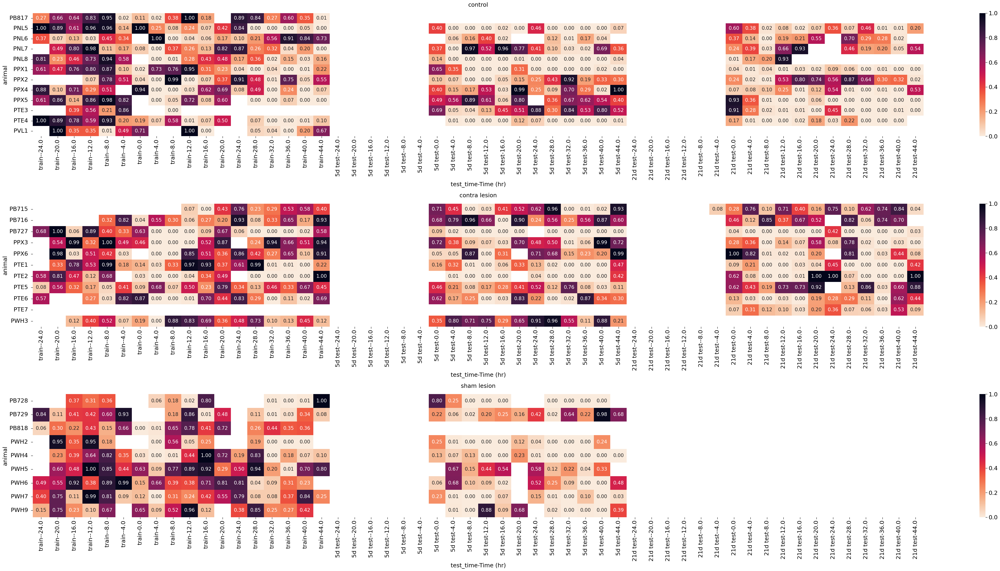

In [221]:
y=25
fg, ax = plt.subplots(3, 1, figsize=(y*2,y))
#cax = ax[0].inset_axes([1.01, 0, 0.01,1])
sns.heatmap(htmp_out.loc['control'], ax=ax[0],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[0].set_title('control')
sns.heatmap(htmp_out.loc['contra lesion'], ax=ax[1],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[1].set_title('contra lesion')
sns.heatmap(htmp_out.loc['sham lesion'], ax=ax[2],vmin = 0, vmax=1, cmap='rocket_r', square=False, annot=True, fmt='0.2f')
ax[2].set_title('sham lesion')
fg.tight_layout()

#### Is performance after SAT2 – break – SAT2 comparable to 5d of training?

In [ ]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
cdfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1) & (firstlast20_means['Time (hr)'] < 48))
                        | ((firstlast20_means['condition'] == 'SAT5') & (firstlast20_means['Strain'] == 'C57'))]

cdfilt.loc[cdfilt['test_time'] == '5d test', 'Day'] += 2
cdfilt.loc[cdfilt['test_time'] == '21d test', 'Day'] += 4
cdfilt.loc[cdfilt['condition'] == 'SAT5', 'cond'] = 'SAT5'

cdfilt['Day_label'] = cdfilt["Day"].apply(day_to_label)
cdfilt['daytime'] = cdfilt['Day_label'] + ' ' + cdfilt['time']
cdfilt['daytimetest'] = cdfilt['daytime'] + ' ' + cdfilt['test_time']

# animal did not learn at SAT5 - inverted anticipatory licking data?
cdfilt = cdfilt[~(cdfilt['animal'] == 'OKE2')]

In [ ]:
days = ['ACC 0 last 20%', 'SAT 2 last 20%', f'SAT 3 first 20%', f'SAT 4 last 20%', f'SAT 5 first 20%', 'SAT 5 last 20%', f'SAT 6 last 20%']
conds = ['SAT5', 'control', 'contra lesion']

for day in days:
    dayfilt = cdfilt[cdfilt["daytime"] == day]
    g = plot_pair_strip(dayfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],col_order=conds,
                        col="cond", jitter=False, aspect=0.5, legend=False, connect=True)
    g.fig.suptitle(day, y=1.03)

In [ ]:
res = []
cdfilt = cdfilt.sort_values(['condition', 'Day', 'time', 'animal'])

stimcond = cdfilt["stimulus"] == "stimulus"
blankcond = cdfilt["stimulus"] == "blank"

conds = ['SAT5', 'control', 'contra lesion']
days = ['ACC 0 last 20%', 'SAT 2 last 20%', f'SAT 3 first 20%', f'SAT 4 last 20%', f'SAT 5 first 20%', 'SAT 5 last 20%', f'SAT 6 last 20%']
filt = (cdfilt.apply(lambda x: x['cond'] in conds, axis=1)) & (cdfilt.apply(lambda x: x['daytime'] in days, axis=1))
ind = cdfilt[filt][["cond", "daytime"]].apply(tuple, axis=1).unique()
ind.sort()

for c, day in ind:
    daycond = cdfilt["daytime"] == day
    ccond = cdfilt["cond"] == c
    #print(firstlast20_means[daycond])
    stim = cdfilt[stimcond & daycond & ccond]["lick"]
    san = cdfilt[stimcond & daycond & ccond][['animal',"lick"]]
    blank = cdfilt[blankcond & daycond & ccond]["lick"]
    ban = cdfilt[blankcond & daycond & ccond][['animal',"lick"]]
    #print(day, c,'stim', san,'blank', ban, '\n')
    res.append(stats.wilcoxon(stim, blank))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[0] + ", " + x[1]))

,statistic,pvalue
"SAT5, ACC 0 last 20%",8.0,0.687500
"SAT5, SAT 2 last 20%",0.0,0.031250
"SAT5, SAT 3 first 20%",0.0,0.031250
"SAT5, SAT 4 last 20%",1.0,0.125000
"SAT5, SAT 5 first 20%",0.0,0.062500
"SAT5, SAT 5 last 20%",0.0,0.062500
"SAT5, SAT 6 last 20%",0.0,1.000000
"contra lesion, ACC 0 last 20%",17.0,0.570312
"contra lesion, SAT 2 last 20%",4.0,0.013672
"contra lesion, SAT 3 first 20%",16.0,0.275391


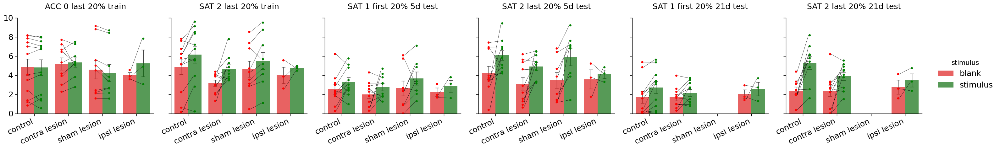

In [597]:
days = ['ACC 0 last 20% train', 'SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
plt_data = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1) 
                              & (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
plot_bar_strip(plt_data, y='lick', x='cond',hue='stimulus', col='daytimetest',
               col_order=days,errorbar='se',err_kws={'lw':1, 'zorder':0}, 
               alpha=0.7, palette=['red', 'green'], dodge=True,
               hue_order=['blank', 'stimulus'], order=conds,
               xlab_kws={'rotation':25, 'ha':'right'}, connect=True,
               )

In [ ]:
res = []
res1 = []
days = ['ACC 0 last 20% train', 'SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
firstlast20_means = firstlast20_means.sort_values(['cond', 'daytimetest', 'stimulus','animal'])

filt = (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1)) & (firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1))
ind = firstlast20_means[filt][["cond", "stimulus"]].apply(tuple, axis=1).unique()

for t,s in ind:
    test = []
    tcond = firstlast20_means['cond'] == t
    scond = firstlast20_means['stimulus'] == s
    for c in days:
        ccond = firstlast20_means["daytimetest"] == c
        dat = firstlast20_means[ccond & tcond & scond]['lick']
        if len(dat) > 1:
            test.append(dat)
    if len(test) > 0:
        res.append(stats.f_oneway(*test))
        res1.append(stats.tukey_hsd(*test))
    else:
        res.append((pd.NA, pd.NA))
        res1.append(pd.NA)

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))

,statistic,pvalue
"blank, contra lesion",5.302062,0.000536
"stimulus, contra lesion",8.506735,0.000007
"blank, control",5.292087,0.000500
"stimulus, control",5.858623,0.000215
"blank, ipsi lesion",1.670251,0.216058
"stimulus, ipsi lesion",1.929309,0.162825
"blank, sham lesion",0.811292,0.499186
"stimulus, sham lesion",0.910363,0.449533


In [ ]:
#{0 : 'ACC 0 last 20% train', 1: 'SAT 2 last 20% train', 
# 2 : 'SAT 1 first 20% 5d test', 3 : 'SAT 2 last 20% 5d test', 
# 4 : 'SAT 1 first 20% 21d test', 5 : 'SAT 2 last 20% 21d test'}
for i in range(len(res1)):
    print(ind[i])
    print(res1[i])

('contra lesion', 'blank')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)      2.024     0.096    -0.209     4.257
 (0 - 2)      3.205     0.001     0.972     5.437
 (0 - 3)      2.071     0.083    -0.161     4.304
 (0 - 4)      3.419     0.001     1.128     5.710
 (0 - 5)      2.887     0.006     0.596     5.177
 (1 - 0)     -2.024     0.096    -4.257     0.209
 (1 - 2)      1.181     0.597    -0.993     3.354
 (1 - 3)      0.048     1.000    -2.126     2.221
 (1 - 4)      1.395     0.444    -0.838     3.628
 (1 - 5)      0.863     0.860    -1.370     3.096
 (2 - 0)     -3.205     0.001    -5.437    -0.972
 (2 - 1)     -1.181     0.597    -3.354     0.993
 (2 - 3)     -1.133     0.638    -3.306     1.040
 (2 - 4)      0.215     1.000    -2.018     2.447
 (2 - 5)     -0.318     0.998    -2.551     1.915
 (3 - 0)     -2.071     0.083    -4.304     0.161
 (3 - 1)     -0.048     1.000    -2.221     2.126
 (3 -

#### first and last 20% difference after break

In [585]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
filt = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)]
filt = filt.set_index(['cond', 'animal', 'stimulus'])
firstlastfilt = [filt[(filt['daytimetest'] == days[i])]['lick']
                    for i in range(len(days))]


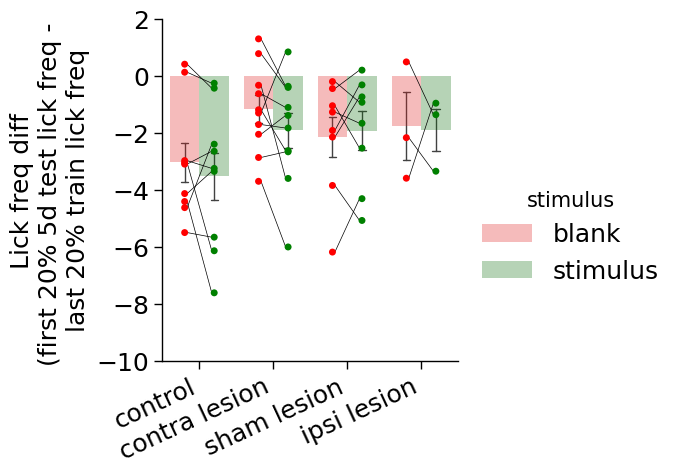

In [586]:
diff = (firstlastfilt[1] - firstlastfilt[0]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-10, 2],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(first 20% 5d test lick freq - \nlast 20% train lick freq')

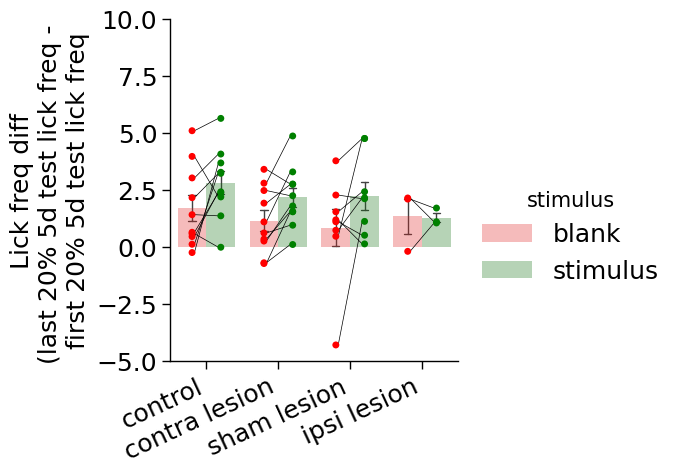

In [587]:
diff = (firstlastfilt[2] - firstlastfilt[1]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-5, 10],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(last 20% 5d test lick freq - \nfirst 20% 5d test lick freq')

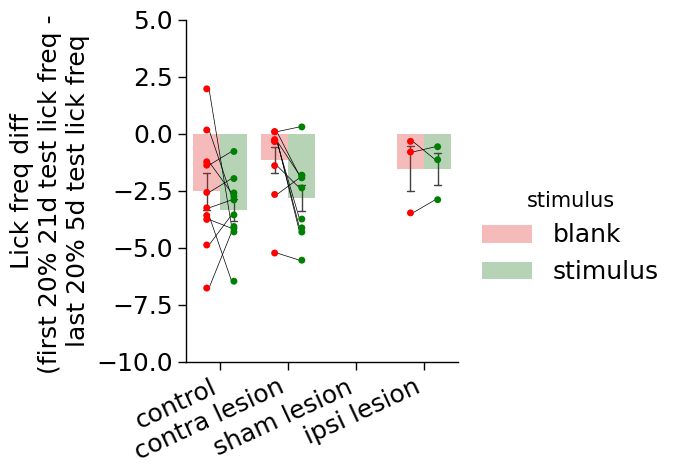

In [588]:
diff = (firstlastfilt[3] - firstlastfilt[2]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-10, 5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(first 20% 21d test lick freq - \nlast 20% 5d test lick freq')

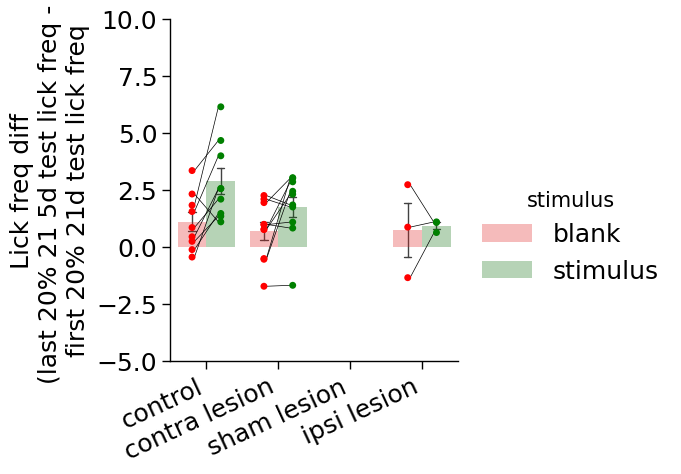

In [589]:
diff = (firstlastfilt[4] - firstlastfilt[3]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-5, 10],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(last 20% 21 5d test lick freq - \nfirst 20% 21d test lick freq')

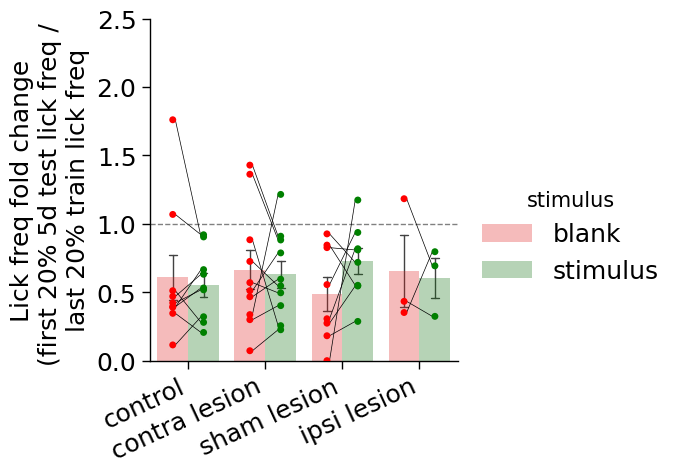

In [590]:
fold = (firstlastfilt[1]/firstlastfilt[0]).reset_index()
g = plot_bar_strip(fold, y='lick', x='cond', hue='stimulus', ylim=[0, 2.5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq fold change\n(first 20% 5d test lick freq / \nlast 20% train lick freq')
g.axes[0][0].axhline(y=1, xmin=0, xmax=1, ls="--", color="grey", zorder=0, lw=1)


In [591]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
filt = firstlast20_perf[firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)]
filt = filt.set_index(['cond', 'animal'])
firstlastperffilt = [filt[(filt['daytimetest'] == days[i])]['lick']
                    for i in range(len(days))]

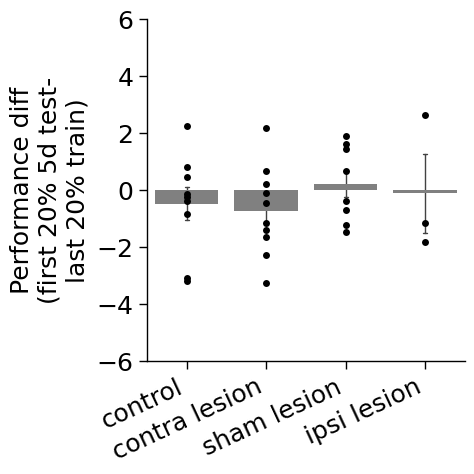

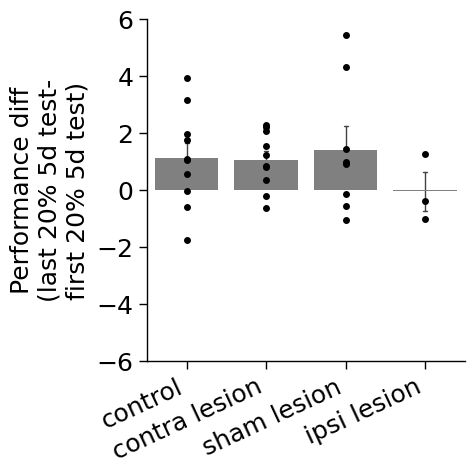

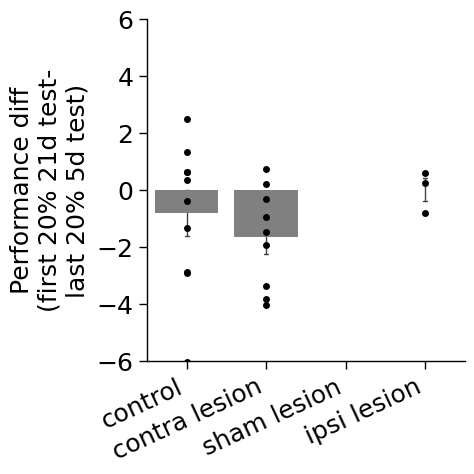

In [592]:
diff = (firstlastperffilt[1] - firstlastperffilt[0]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(first 20% 5d test-\nlast 20% train)')

diff = (firstlastperffilt[2] - firstlastperffilt[1]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(last 20% 5d test-\nfirst 20% 5d test)')

diff = (firstlastperffilt[3] - firstlastperffilt[2]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(first 20% 21d test-\nlast 20% 5d test)')

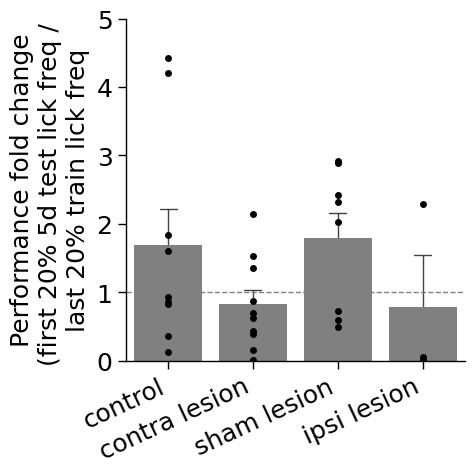

In [593]:
fold = (firstlastperffilt[1]/firstlastperffilt[0]).abs().reset_index()
g = plot_bar_strip(fold, y='lick', x='cond', ylim=[0, 5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=1, dodge=True,
                order=conds, color='grey', pt_color='k',
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Performance fold change\n(first 20% 5d test lick freq / \nlast 20% train lick freq')
g.axes[0][0].axhline(y=1, xmin=0, xmax=1, ls="--", color="grey", zorder=0, lw=1)

#### variance

In [ ]:
ant_means_sd = get_sd(ant_means, ['condition', 'stimulus', 'Time (hr)'])
ant_means_sd = ant_means_sd[ant_means_sd['Time (hr)'] < 48]
ant_means_sd.loc[ant_means_sd['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_means_sd.loc[ant_means_sd['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

ant_perf_sd = get_sd(ant_perf, ['condition', 'Time (hr)'])
ant_perf_sd = ant_perf_sd[ant_perf_sd['Time (hr)'] < 48]
ant_perf_sd.loc[ant_perf_sd['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_perf_sd.loc[ant_perf_sd['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

In [ ]:
ylim = [-0.1, 10]
xlim = [-24, 192]
xticklab = ['', -24, -12, 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48]
plot_retrain('control', ant_means_sd, ant_perf_sd, pd.DataFrame(), xlim, xticklab, lckylim=[0,10], perfylim=[0,10])
plot_retrain('contra lesion', ant_means_sd, ant_perf_sd, pd.DataFrame(), xlim, xticklab, lckylim=[0,10], perfylim=[0,10])

#### Higher consummatory lick frequency in SAT2 for control animals is not due to control animals drinking more water at SAT2

In [322]:
water_drank_data = pd.read_excel(r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\behavior_data\retrain_metadata.xlsx').iloc[0:92, 0:20]

In [336]:
water_drank = water_drank_data.melt(id_vars=['Animal ID', 'animal', 'Sex', 'Strain', 'lesion','Cage', 'Date', 'Age', 'birth date','acc', 'droplet size'], value_vars=['water ACC', 'water SAT1', 'water SAT2'], var_name='day', value_name='water drank (mL)')
water_drank['calc droplet size (ul)'] = water_drank_data.melt(value_vars=['calc. drop ACC0', 'calc drop SAT1', 'calc drop SAT2'], var_name='day', value_name='droplet size (ul)')['droplet size (ul)']
water_drank['trial no'] = water_drank_data.melt(value_vars=['trial no ACC 0', 'trial no SAT 1', 'trial no SAT2'], var_name='day', value_name='trial no')['trial no']
water_drank['test_time'] = water_drank['Animal ID'].str.lstrip('PWBXTVEHSNL123456789 ')
water_drank = water_drank[water_drank['trial no'] >= 100]
water_drank['day'] = water_drank['day'].str.lstrip('water ')
water_drank['lesion'] = water_drank['lesion'].replace({'no': 'control', 'contra':'contra lesion', 'sham':'sham lesion', 'ipsi':'ipsi lesion'})
#water_drank['animal'] = water_drank['animal'].str.rstrip('retraintest')
water_drank['test_time'] = water_drank['test_time'].replace({'retrain':'5d test', 'test': '21d test'})

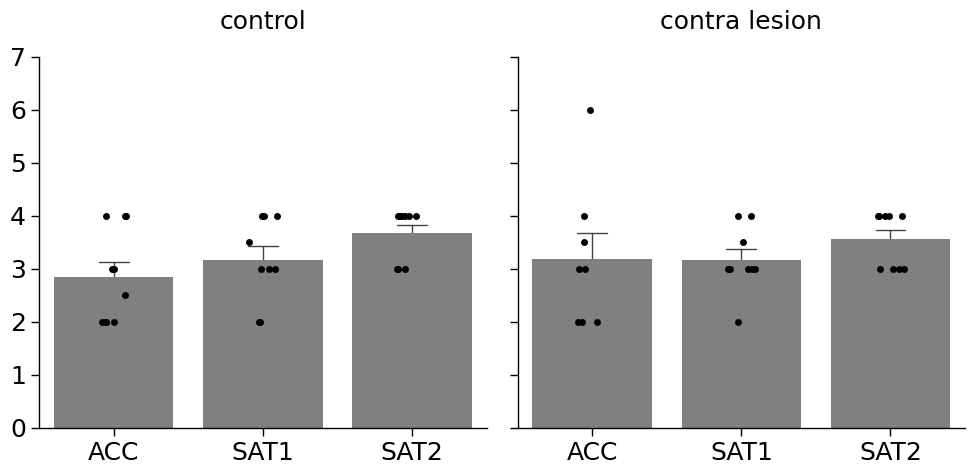

In [324]:
plot_bar_strip(water_drank[water_drank['test_time'] == 'train'], x='day', y='water drank (mL)', col='lesion',col_order=['control', 'contra lesion'],
               errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2, color='grey', pt_color='k',
                ylim=[0, 7],xlim=[-0.5, 2.5], connect=False, jitter=True)

#### Control animals did more trials than lesioned animals, so difference in licking frequency could be related to a difference in trial number

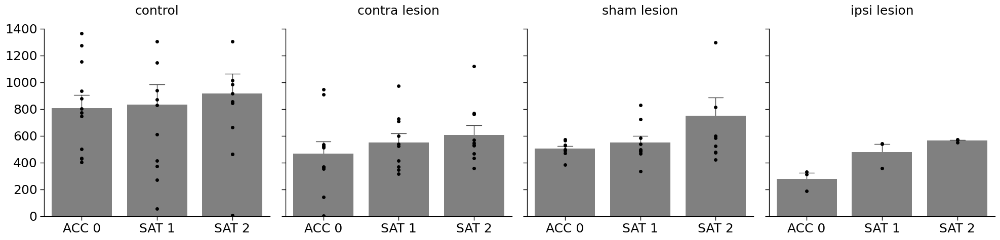

In [325]:
days = ['ACC 0', 'SAT 1', 'SAT 2']
plot_bar_strip(trials_day[(trials_day['test_time'] == 'train')
                        & (trials_day.apply(lambda x: x['Day'] in days, axis=1))],
                x='Day', y='trial no', col='cond', color='grey', pt_color='k',ylim=[0,1400],
               col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
               order=days, xlim=[-0.5, 2.5])

#### Difference in trial number is not due to different sets of cages being used for different conditions

In [326]:
def get_cage_counts(df, gpcols):
    counts = df.groupby(['cond', 'test_time', 'animal']).first().groupby(gpcols).count()['stimulus']
    kpcols = df.columns.drop(gpcols + ['animal', 'stimulus'])
    kp = df.groupby(gpcols)[kpcols].first()
    return pd.concat([counts, kp], axis=1).reset_index()

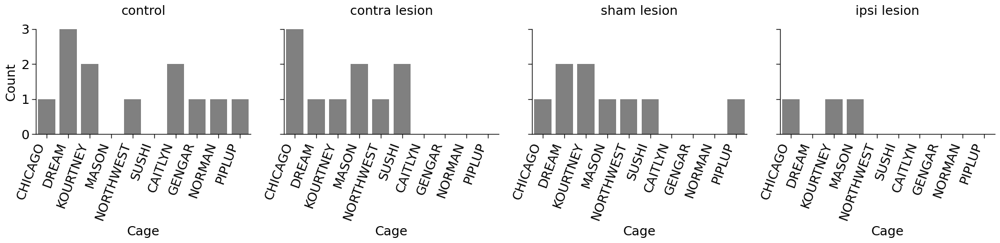

In [327]:
cage_counts = get_cage_counts(trials_day,['cond', 'test_time', 'Cage'])
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']

g = sns.catplot(cage_counts[(cage_counts['test_time']=='train')
                          & (cage_counts.apply(lambda x: x['cond'] in conds, axis=1))], 
                y='stimulus', x='Cage',kind='bar', col='cond', color='grey', col_order=conds)

for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_ylabel('Count')
    g.axes_dict[name].tick_params(labelbottom=True, labeltop=False)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels(), rotation=70, ha='right')
g.tight_layout()

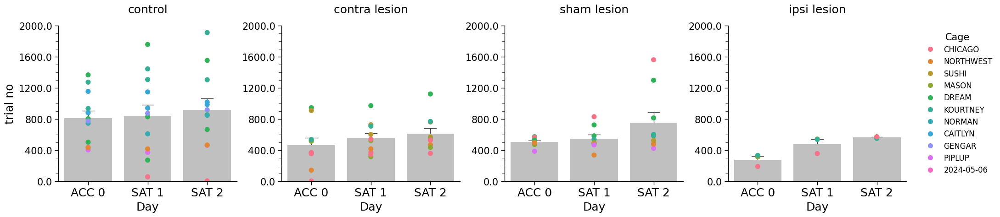

In [328]:
ordr = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
ordr1 = ['ACC 0', 'SAT 1', 'SAT 2']
cages = trials_day[trials_day.apply(lambda x: x['cond'] in ordr, axis=1)]['Cage'].unique()
g = plot_bar(trials_day[(trials_day.apply(lambda x: x['cond'] in ordr, axis=1)) & (trials_day['test_time'] == 'train')
                              & (trials_day.apply(lambda x: x['Day'] in ordr1, axis=1))],
                   y='trial no', x='Day', col='cond', native_scale=False, sharex=True, sharey=True,
                   order=ordr1,aspect=1,xlim=None,col_order=ordr,color='silver',
                   dodge='auto', legend=True,fill=True, linewidth=1,
                   #palette=['#DBDBDB', '#C8CFFF', '#FCAEF3'],
                   width=.8, ylim=[0, 2000], ymajmult=400, yminmult=100,alpha=1)
i=0
for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels())
    f = sns.stripplot(trials_day[(trials_day['cond'] == name) & (trials_day['Strain'] != 'u')& (trials_day['test_time'] == 'train' )
                  ], ax=g.axes_dict[name],hue_order=cages,
                x="Day", y="trial no",size=8, dodge=False, legend=(i==0), hue='Cage',
                order=['ACC 0', 'SAT 1', 'SAT 2'], jitter=False)
    if i==0:
       sns.move_legend(g.axes_dict[name], 'upper left', ncol=1, bbox_to_anchor=(4.8,1), fontsize=12)
    i+=1
    g.axes_dict[name].yaxis.set_tick_params(labelleft=True)
    g.axes_dict[name].set_yticklabels(g.axes_dict[name].get_yticks(), fontsize=15)

#### Difference in trial number is not due to strain differences

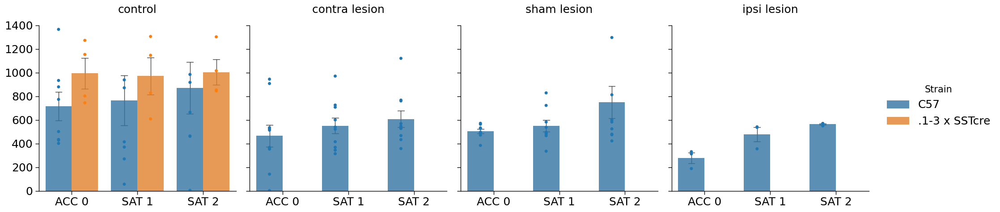

In [329]:
days = ['ACC 0', 'SAT 1', 'SAT 2']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
plot_bar_strip(trials_day[(trials_day['test_time'] == 'train')
                        & (trials_day.apply(lambda x: x['Day'] in days, axis=1))
                        &(trials_day.apply(lambda x: x['cond'] in conds, axis=1))],
                x='Day', y='trial no', col='cond',ylim=[0,1400],
               col_order=conds,dodge=True,alpha=0.8,
               order=days, xlim=[-0.5, 2.5], hue='Strain', hue_order=['C57', '.1-3 x SSTcre'])

### Greater consummatory licking in control animals is correlated with faster recovery to air puff

### Lick frequency is lower at later  test times

#### Animals do a similar number of trials across time

In [333]:
tot = trials[(trials['Time (hr)'] >= 0) & (trials['Time (hr)'] < 48)].groupby(['condition', 'animal'])['trial no'].sum()
kp = trials[(trials['Time (hr)'] >= 0) & (trials['Time (hr)'] < 48)].groupby(['condition', 'animal'])[['Age', 'Strain', 'Date', 'Cage']].first()
tot = pd.concat([tot, kp], axis=1).reset_index().rename(columns={0:'trial no'})
format_condition(tot)
tot['an'] = tot['animal']
tot['animal'] = tot['animal'].str.rstrip('retraintest ')
tot

,condition,animal,trial no,Age,Strain,Date,Cage,cond,test_time,an
0,0.1 mg DCZ hm4di,OHQ3,427,28.0,SSTcre,u,CHICAGO,hM4Di + DCZ,train,OHQ3
1,0.1 mg DCZ hm4di,OHQ5,489,26.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OHQ5
2,0.1 mg DCZ hm4di,OHQ6,427,29.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OHQ6
3,0.1 mg DCZ hm4di,OKK4,606,29.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OKK4
4,0.1 mg DCZ hm4di,OKK7,394,29.0,SSTcre,u,CHICAGO,hM4Di + DCZ,train,OKK7
...,...,...,...,...,...,...,...,...,...,...
267,sham lesion train,PWH4,1121,41.0,C57,2024-04-24,KOURTNEY,sham lesion,train,PWH4 train
268,sham lesion train,PWH5,961,44.0,C57,2024-04-27,MASON,sham lesion,train,PWH5 train
269,sham lesion train,PWH6,1021,38.0,C57,2024-04-21,SUSHI,sham lesion,train,PWH6 train
270,sham lesion train,PWH7,1536,41.0,C57,2024-04-24,DREAM,sham lesion,train,PWH7 train


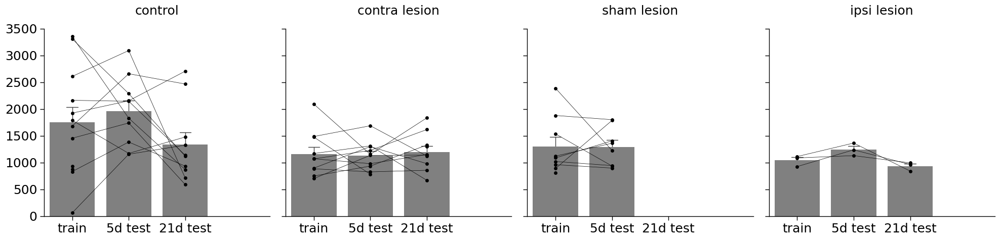

In [334]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
times = ['train', '5d test', '21d test']
g = plot_bar_strip(tot[(tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control')], 
                y='trial no', x='test_time', col='cond', order=times, col_order=conds,pt_color='k',connect=True,
                errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2, ylim=[0, 3500])

#### Animals drink a similar amount of water across test time and day

Text(0.5, 1.02, 'control')

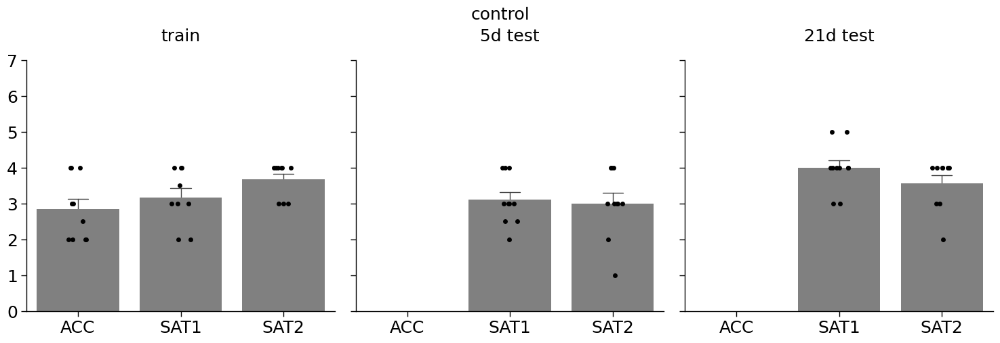

In [337]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
times = ['train', '5d test', '21d test']
g = plot_bar_strip(water_drank[water_drank['lesion'] == 'control'], 
                y='water drank (mL)', x='day', col='test_time',pt_color='k',connect=False,xlim=[-0.5, 2.5],
                errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2, ylim=[0, 7], jitter=True)
g.fig.suptitle('control', y=1.02)

#### measured droplet size is lower for contra lesioned animals, and was higher at 21d test for control animals

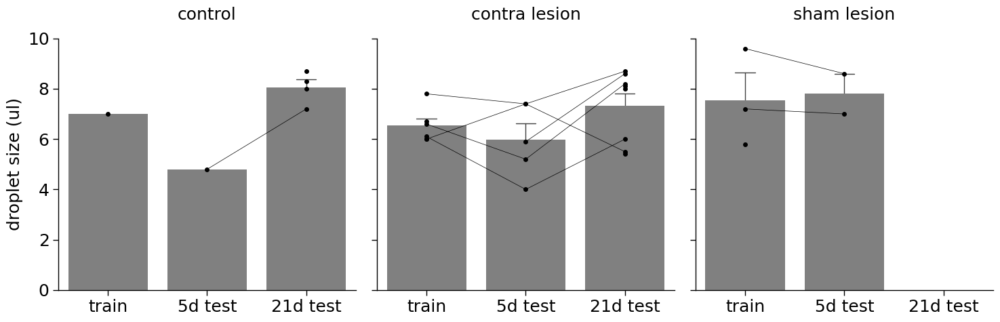

In [338]:
g = plot_bar_strip(water_drank[water_drank['day'] == 'SAT2'], x='test_time', 
                   y='droplet size', col='lesion',col_order=['control', 'contra lesion', 'sham lesion'],
                   order=['train', '5d test', '21d test'], xlim=[-0.5, 2.5],
                   errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                   ylabel='droplet size (ul)', pt_color='black', jitter=False, connect=True)

#### Measured droplet size is negatively correlated with trial number

In [341]:
tot = tot.set_index('an')
water_drank_data = water_drank_data.set_index('Animal ID')
tot.loc[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control')), 'droplet size'] = water_drank_data['droplet size'].dropna()
tot = tot.reset_index()
water_drank_data = water_drank_data.reset_index()
tot['droplet size'].unique()

array([nan, 7.4, 5.2, 5.9, 4. , 8.7, 8.1, 8.2, 5.5, 8.6, 6. , 5.4, 8. ,
       7.8, 6.7, 6.6, 6.1, 4.8, 7.2, 8.3, 7. , 7.3, 6.3, 8.5, 5.3, 5.8,
       9.6])

In [342]:
def lin(x, b, a):
    return a*x + b

def inv(x, b, a):
    return a/x + b

slope: -136.641, y-int: 2096.162,R:-0.47623, pval:0.002



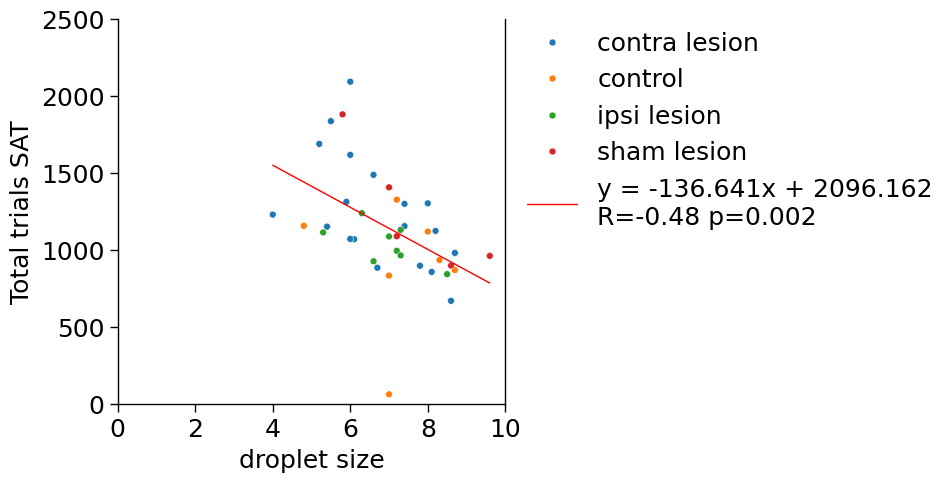

In [351]:
f, ax = plt.subplots(1,1, figsize=(5,5))
regress = tot[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control'))].dropna().sort_values('droplet size')

xdata = regress['droplet size']
ydata = regress['trial no']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
sns.scatterplot(tot[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control'))], x='droplet size',y='trial no', hue='cond', ax=ax, legend=True)
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('Total trials SAT')
ax.get_legend().set_visible(False)
ax.set_ylim([0, 2500])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.8, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))




In [ ]:
tot = tot.set_index('an')
water_drank_data = water_drank_data.set_index('Animal ID')
tot.loc[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control')), 'droplet size'] = water_drank_data['droplet size'].dropna()
tot = tot.reset_index()
water_drank_data = water_drank_data.reset_index()
tot['droplet size'].unique()

#### Measured droplet size is uncorrelated with anticipatory lick frequency

In [375]:
last20_filt = firstlast20_means[(firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)) 
                              & (firstlast20_means['stimulus'] == 'stimulus') & (firstlast20_means['daytimetest'] == 'SAT 2 last 20% train')]
last20_filt['an'] = last20_filt['animal'] + ' ' + last20_filt['test_time']
last20_filt = last20_filt.set_index('an')
water_drank_data = water_drank_data.set_index('Animal ID')
last20_filt['droplet size'] = water_drank_data['droplet size'].dropna()
last20_filt = last20_filt.reset_index()
water_drank_data = water_drank_data.reset_index()

slope: -0.050, y-int: 4.693,R:-0.02741, pval:0.929



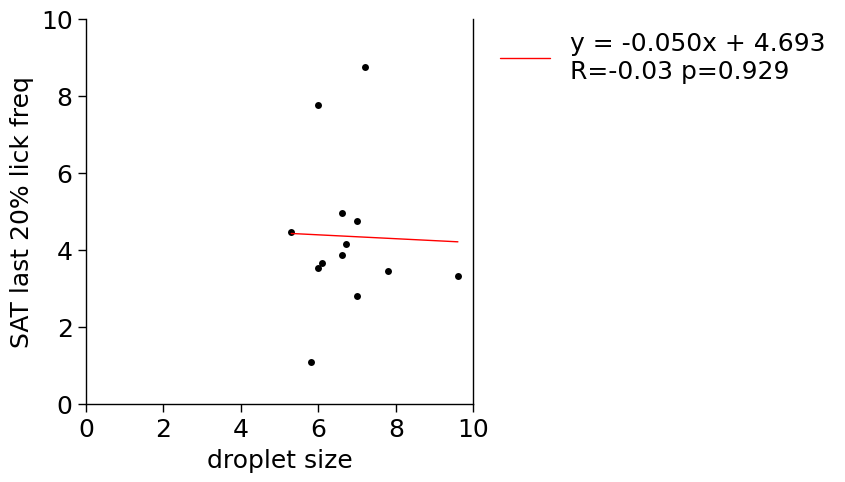

In [377]:
f, ax = plt.subplots(1,1, figsize=(5,5))
regress = last20_filt[['an', 'lick', 'droplet size']].dropna().sort_values('droplet size')

xdata = regress['droplet size']
ydata = regress['lick']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
#sns.scatterplot(last20_filt, x='droplet size',y='trial no', hue='cond', ax=ax, legend=True)
ax.plot(xdata, ydata, 'ko')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('SAT last 20% lick freq')
#ax.get_legend().set_visible(False)
ax.set_ylim([0, 10])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.65, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))

#### Measured droplet size and calculated droplet size (averaged across days) are positively correlated

slope: 0.666, y-int: 1.559,R:0.49343, pval:0.002



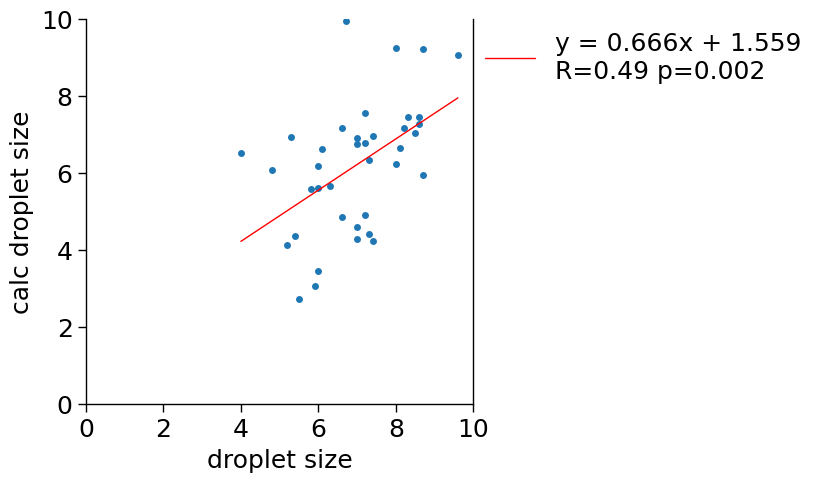

In [344]:
f, ax = plt.subplots(1,1, figsize=(5,5))

regress = water_drank.dropna()
regress = regress[~((regress['Animal ID'] == 'PB715 train'))]
regress = regress.groupby(['Animal ID', 'lesion'])[['calc droplet size (ul)', 'droplet size']].mean().reset_index()
regress = regress.sort_values('droplet size')
ydata = regress['calc droplet size (ul)']
xdata = regress['droplet size']
res = stats.linregress(xdata.astype(float), y=ydata.astype(float))
popt = (res.intercept, res.slope)
ax.plot(xdata, ydata, marker='o', ls='')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('calc droplet size')
#ax.get_legend().set_visible(False)
ax.set_ylim([0, 10])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.6, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))

### heatmap by animal

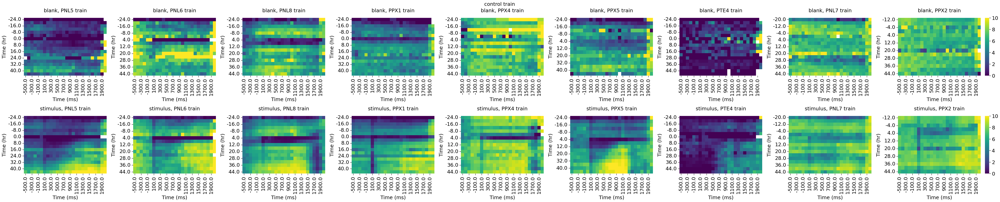

In [ ]:
heatmap_data = means_full[(means_full['Time (hr)'] >= -24) & (means_full['Time (hr)'] <= 48)]#.groupby(['condition', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
conds = ['control train'] #['control train','contra lesion train', 'ipsi lesion train', 'SAT5', 'Contra-lesion', 'Ipsi-lesion',]
for c in conds:
    plt_data = heatmap_data[(heatmap_data['Time (ms)'] >=-500) &(heatmap_data['Time (ms)'] <= 2000) & (heatmap_data['condition'] == c) & (heatmap_data['animal'] != 'PTE3 train')]
    fg = draw_facet(plt_data, 
                            htmp_args,draw_heatmap, col='animal',cmap='viridis', row='stimulus', vmin=0, vmax=10)
    fg.suptitle(c, y=1.01)
#fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'blank') &(heatmap_data['Time (ms)'] <= 2000)], htmp_args, col='condition', cmap='viridis', vmin=0, vmax=10)
#fg.suptitle('blank', y=1.01)

In [229]:
perf_full['animal'] = perf_full['animal'].str.rstrip('retraintest')

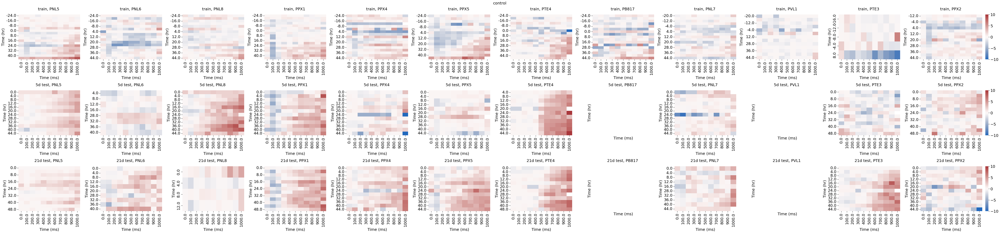

In [232]:
heatmap_data = perf_full[(perf_full['Time (hr)'] >= -24) & (perf_full['Time (hr)'] <= 48)]#.groupby(['condition', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
conds = ['control'] #['control train','contra lesion train', 'ipsi lesion train', 'SAT5', 'Contra-lesion', 'Ipsi-lesion',]
for c in conds:
    plt_data = heatmap_data[(heatmap_data['Time (ms)'] >=0) &(heatmap_data['Time (ms)'] <= 1000) & (heatmap_data['cond'] == c) & (heatmap_data['animal'] != 'PTE3 train')]
    fg = draw_facet(plt_data, 
                            htmp_args,draw_heatmap, col='animal',cmap='vlag', row='test_time',vmin=-6, vmax=6)
    fg.suptitle(c, y=1.01)
#fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'blank') &(heatmap_data['Time (ms)'] <= 2000)], htmp_args, col='condition', cmap='viridis', vmin=0, vmax=10)
#fg.suptitle('blank', y=1.01)

#### baseline

In [ ]:
baseline = means_full[(means_full['Time (ms)'] <= 0) & (means_full['Time (ms)'] >= -300)].groupby(['cond', 'test_time', 'animal', 'Time (hr)', 'stimulus'])['lick'].mean()
norm_filtmeans = means_full.pivot(index=['cond', 'test_time', 'animal', 'Time (hr)','stimulus'], columns='Time (ms)', values='lick').sub(baseline, axis=0)
norm_filtmeans = norm_filtmeans.stack().rename('lick').reset_index()

In [ ]:
plt_base = baseline.reset_index()
acc_baseline = plt_base[(plt_base['Time (hr)'] >= -12) & (plt_base['Time (hr)'] <= -4)].groupby(['cond', 'test_time', 'animal', 'stimulus'])['lick'].mean().rename('baseline')
acc_baseline

cond           test_time  animal       stimulus
contra lesion  train      PB716 train  blank       7.014319
                                       stimulus    7.059326
                          PB727 train  blank       5.882448
                                       stimulus    4.766163
                          PPX3 train   blank       6.287037
                                       stimulus    4.918959
                          PPX6 train   blank       7.628968
                                       stimulus    6.396500
                          PTE1 train   blank       5.206627
                                       stimulus    4.381102
                          PTE2 train   blank       8.028846
                                       stimulus    6.084952
                          PTE5 train   blank       3.416250
                                       stimulus    3.941665
                          PTE6 train   blank       7.231166
                                       stimulus    7

In [ ]:
fill_data =  plt_base[(plt_base['Time (hr)'] >= 0) & (plt_base['Time (hr)'] <= 48)].pivot(index=['condition', 'animal', 'stimulus'], columns='Time (hr)', values='lick').fillna(method='bfill', axis=1)
anova_data = pd.concat([acc_baseline, fill_data], axis=1).stack().reset_index().rename(columns={'level_3':'Time (hr)', 0:'lick'})
anova_data['Time (hr)'] = anova_data['Time (hr)'].astype(str)
#anova_data = plt_base[(plt_base['Time (hr)'] >= 0) & (plt_base['Time (hr)'] <= 48)]
aov = pg.mixed_anova(data=anova_data[anova_data['stimulus'] =='stimulus'], dv='lick', between='condition', within='Time (hr)', subject='animal')
print('stimulus')
pg.print_table(aov)
print('blank')
aov = pg.mixed_anova(data=anova_data[anova_data['stimulus'] =='blank'], dv='lick', between='condition', within='Time (hr)', subject='animal')
pg.print_table(aov)

In [ ]:
for cond in anova_data['condition'].unique():
    if cond in ['Contra-lesion', 'Ipsi-lesion', 'SAT 5', 'contra lesion train', 'control train']:
        print(cond)
        print('stimulus')
        aov = pg.rm_anova(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'stimulus')], 
                        dv='lick', within=['Time (hr)'], subject='animal')
        pg.print_table(aov)
        res = pg.pairwise_tests(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'stimulus')], dv='lick', within='Time (hr)', subject='animal', parametric=False)
        pg.print_table(res[res['p-unc'] <= 0.05])
        print('blank')
        aov = pg.rm_anova(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'blank')], 
                        dv='lick', within=['Time (hr)'], subject='animal')
        pg.print_table(aov)
        res = pg.pairwise_tests(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'blank')], dv='lick', within='Time (hr)', subject='animal', parametric=False)
        pg.print_table(res[res['p-unc'] <= 0.05])



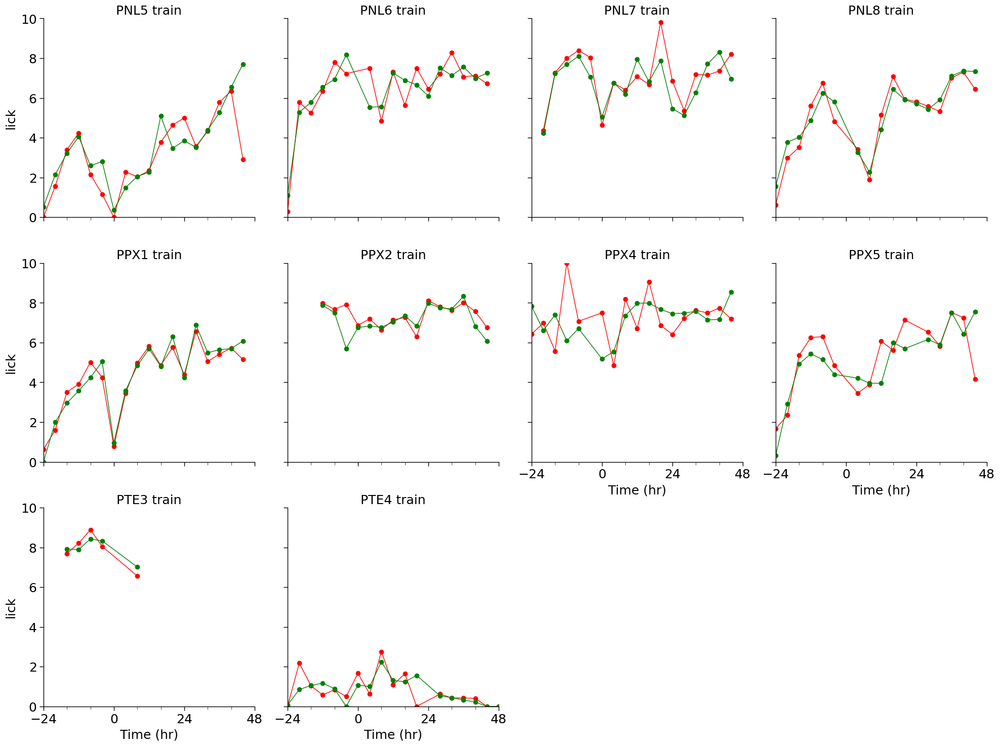

In [ ]:
#c = (plt_base['condition'] == 'contra lesion train') | (plt_base['condition'] == 'ipsi lesion train') | (plt_base['condition'] == 'control train') | (plt_base['condition'] == 'sham lesion train')
c = (plt_base['cond'] == 'control') & (plt_base['test_time'] == 'train')
cod = ['contra lesion train', 'ipsi lesion train', 'sham lesion train', 'control train']
g = sns.relplot(plt_base[c], x='Time (hr)', y='lick', hue='stimulus', 
            col='animal', hue_order=['blank', 'stimulus'], palette=['red', 'green'],#col_order=cod,
            kind='line', errorbar='se', err_style='bars', marker='o', ls='-', mec=None, ms=7, lw=1,col_wrap=4,
            err_kws={'lw':0.7}, legend=False)
markers=['o', 'v', '^', '<', '>', '8', 's', 'p', 'P', '*', 'h', 'X', 'D']
for name, ax in g.axes_dict.items():
#    tmp = plt_base[plt_base['condition']==name]
#    i=0
#    for a in tmp['animal'].unique():
#        sns.lineplot(plt_base[plt_base['animal']==a],x='Time (hr)', y='lick', hue='stimulus', palette=['#FFBDBD', '#C6FFBD'],
#                    marker=markers[i], ls='-', mec=None, ms=5, lw=1,legend=False, ax=ax, zorder=0)
#        i+=1
    ax.set_title(f'{name}', y=0.95)
    ax.set_xlim([-24, 48])
    ax.set_ylim([0, 10])
    ax.xaxis.set_major_locator(ticker.MultipleLocator(24))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(8))
plt.tight_layout()

In [ ]:
norm_filtmeans

,condition,animal,Time (hr),stimulus,Time (ms),lick
0,contra lesion retrain,PB715 retrain,0.0,blank,-800.0,-6.428571
1,contra lesion retrain,PB715 retrain,0.0,blank,-700.0,-1.428571
2,contra lesion retrain,PB715 retrain,0.0,blank,-600.0,-3.095238
3,contra lesion retrain,PB715 retrain,0.0,blank,-500.0,1.071429
4,contra lesion retrain,PB715 retrain,0.0,blank,-400.0,1.071429
...,...,...,...,...,...,...
83292,sham lesion train,PWH9 train,48.0,stimulus,6300.0,5.939552
83293,sham lesion train,PWH9 train,48.0,stimulus,6400.0,5.939552
83294,sham lesion train,PWH9 train,48.0,stimulus,6500.0,-4.060448
83295,sham lesion train,PWH9 train,48.0,stimulus,6600.0,-4.060448


Text(0.5, 1.01, 'blank normalized to baseline')

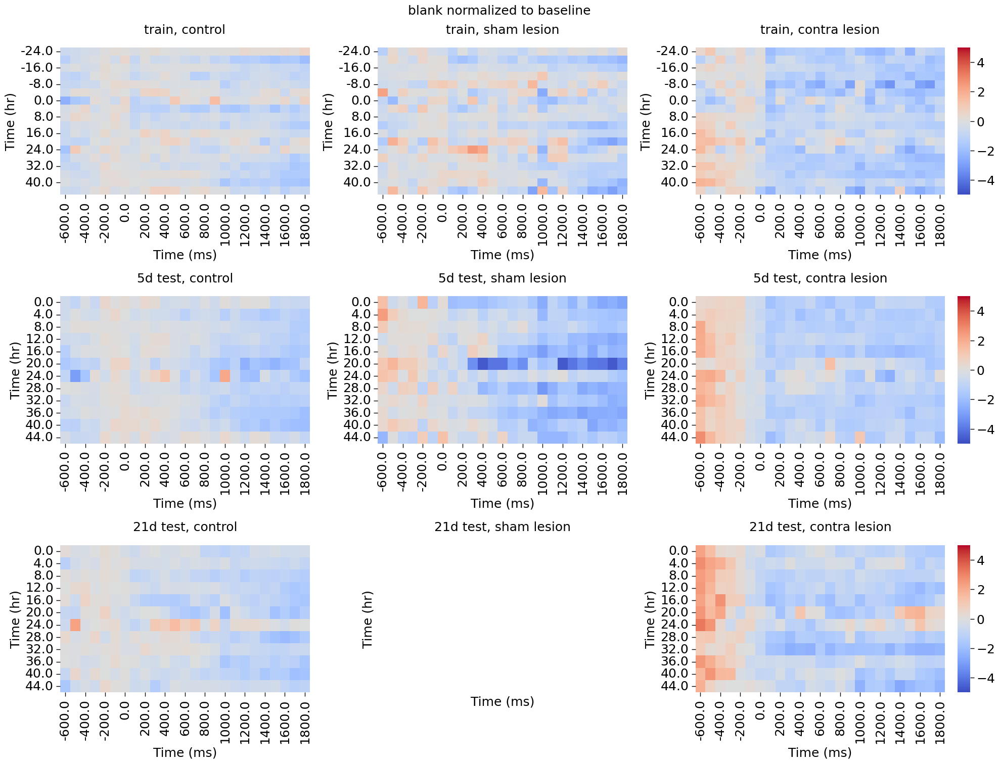

In [ ]:
heatmap_data = norm_filtmeans[(norm_filtmeans['Time (hr)'] >= -24) & (norm_filtmeans['Time (hr)'] < 48)].groupby(['cond','test_time', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
conds = ['control', 'sham lesion', 'contra lesion']
fg = draw_facet(heatmap_data[(heatmap_data.apply(lambda x: x['cond'] in conds, axis=1)) & (heatmap_data['Time (ms)'] > -700) & (heatmap_data['Time (ms)'] <= 1800)
                             &(heatmap_data['stimulus'] =='blank')], 
                        htmp_args,draw_heatmap, row='test_time', col='cond', cmap='coolwarm', 
                        col_order=['control', 'sham lesion', 'contra lesion'],
                        row_order=['train', '5d test', '21d test'],
                        vmin=-5, vmax=5)
# fg.suptitle('MZ contra lesion norm to baseline', y=1.01)
# fg = draw_facet_heatmap(heatmap_data[(heatmap_data['condition'] == 'Ipsi-lesion') & (heatmap_data['Time (ms)'] > -200) & (heatmap_data['Time (ms)'] <= 2000)], 
#                         htmp_args, col='stimulus', cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('blank normalized to baseline', y=1.01)

Text(0.5, 1.01, 'train norm to baseline')

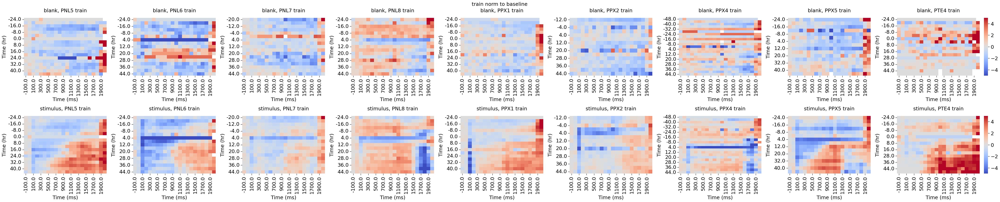

In [ ]:
#heatmap_data['animal']  = heatmap_data['animal'].str.rstrip('retains').str.rstrip(' ')
c = (norm_filtmeans['cond'] == 'control') & (norm_filtmeans['Time (ms)'] > -200) & (norm_filtmeans['Time (ms)'] <= 2000)
fg = draw_facet(norm_filtmeans[c & (norm_filtmeans['test_time'] =='train') & (norm_filtmeans['animal'] != 'PTE3 train')], 
                                htmp_args, draw_heatmap,col='animal',row='stimulus', cmap='coolwarm', 
                                vmin=-5, vmax=5)
fg.suptitle('train norm to baseline', y=1.01)

# #fg = draw_facet_heatmap(heatmap_data[c & (heatmap_data['time'] =='retrain')], 
#                                 htmp_args, col='animal', row='stimulus',cmap='coolwarm', 
#                                 vmin=-5, vmax=5)
# fg.suptitle('retrain norm to baseline', y=1.01)

In [ ]:
heatmap_data = norm_filtmeans[(norm_filtmeans['Time (hr)'] >= -24) & (filtmeans['Time (hr)'] <= 48)]#.groupby(['cond', 'time', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
for c in heatmap_data['cond'].unique():
    if c == 'contra lesion':
        c = (heatmap_data['cond'] == c) & (heatmap_data['Time (ms)'] > -200) & (heatmap_data['Time (ms)'] <= 2000)
        fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'stimulus') & c], 
                                htmp_args,row='time', col='animal', cmap='coolwarm', vmin=-5, vmax=5)
        fg.suptitle('stimulus norm to baseline', y=1.01)
        fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'blank') & c], 
                                htmp_args,row='time', col='animal', cmap='coolwarm', vmin=-5, vmax=5)
        fg.suptitle('blank norm to baseline', y=1.01)

#### instentanteous lick freq by hour

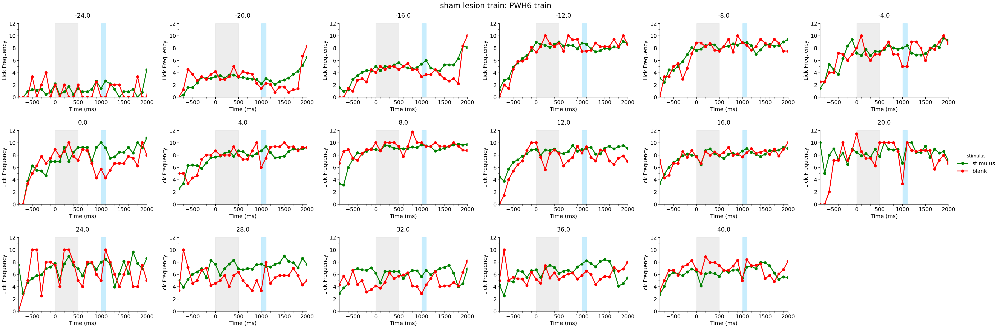

In [102]:
for c in means_full['condition'].unique():
    #if 'contra lesion train' in c:
        for a in means_full[(means_full['condition'] == c)]['animal'].unique():
            if a == 'PWH6 train':
                plot_lickfreq(means_full[(means_full['animal'] == a)], suptitle=f'{c}: {a}',
                            col_wrap=6,errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-800, 2000])

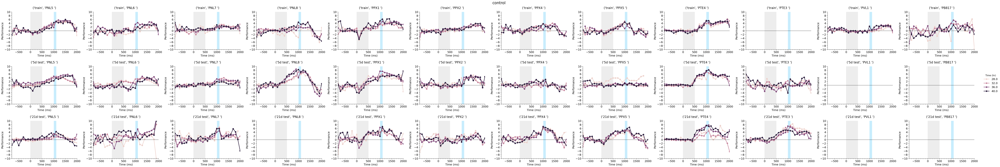

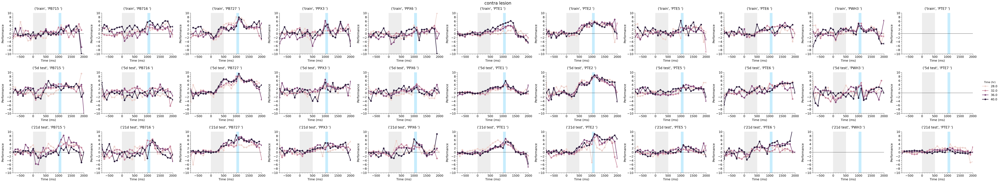

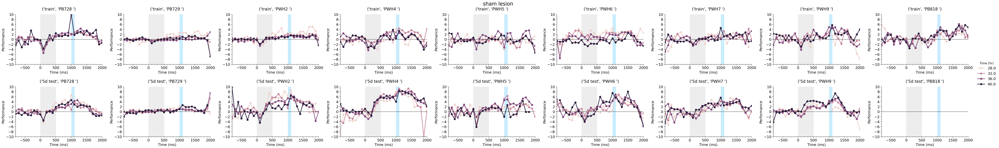

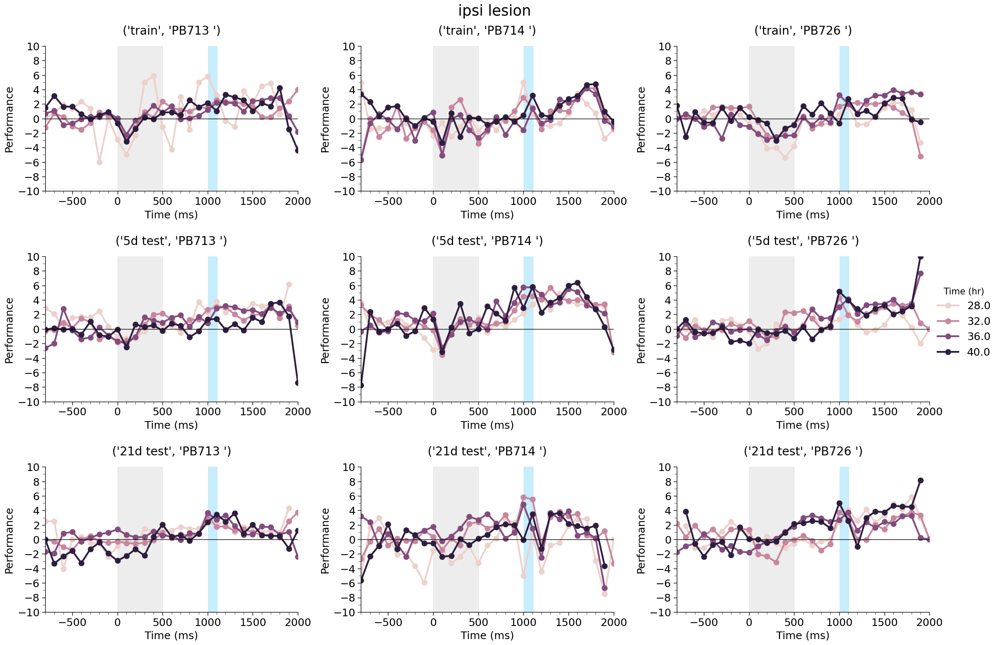

In [581]:
for c in conds:
    #if 'contra lesion train' in c: 
    plot_perf(perf_full[(perf_full['cond'] == c) & (perf_full['Time (hr)'] < 44) & (perf_full['Time (hr)'] > 24)], suptitle=f'{c}',col='animal',
              row='test_time', col_wrap=None,errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-800, 2000])

In [ ]:
cond1 = means_subset[(means_subset['stimulus'] == 'blank') & (means_subset['time (ms) group'] == 'consummatory') 
           & (means_subset['time (hr) group'] == 'SAT2') & (means_subset['test_time'] == 'train') 
           & (means_subset['cond'] == 'control')]['lick']
cond2 = means_subset[(means_subset['stimulus'] == 'blank') & (means_subset['time (ms) group'] == 'consummatory') 
           & (means_subset['time (hr) group'] == 'SAT2') & (means_subset['test_time'] == 'train') 
           & (means_subset['cond'] == 'contra lesion')]['lick']

stats.mannwhitneyu(cond1, cond2)

MannwhitneyuResult(statistic=69.0, pvalue=0.055013832353979004)

In [ ]:
res = []
res1 = []
trials_day = trials_day.sort_values(['condition', 'animal', 'Day'])

filt = ~(trials_day['condition'].str.contains('-')) & ~(trials_day['condition'].str.contains('SAT'))
ind = trials_day[filt][["Day", "time"]].apply(tuple, axis=1).unique()
#ind = daytotsfilt[filt]['time'].unique()
conds = trials_day[filt]['cond'].unique()

for d, t in ind:
    test = []
    tcond = trials_day['time'] == t
    dcond = trials_day['Day'] == d
    for c in conds:
        ccond = trials_day["cond"] == c
        dat = trials_day[ccond & tcond & dcond]['trial no']
        if len(dat) > 1:
            test.append(dat)
    #print(t, test)
    if len(test) > 0:
        res.append(stats.f_oneway(*test))
        res1.append(stats.tukey_hsd(*test))
    else:
        res.append(pd.NA)
        res1.append(pd.NA)

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))


,statistic,pvalue
"retrain, SAT 1",5.730165,0.012525
"retrain, SAT 2",7.29253,0.005167
"test, SAT 1",0.139633,0.718355
"test, SAT 2",0.135453,0.723721
"train, SAT 1",3.760575,0.040184
"train, SAT 2",5.156077,0.015636
"train, ACC 0",6.322429,0.007450
"train, ACC -1",<NA>,NaN


In [ ]:
#0 - contra lesion, 1 - control, 2 - sham/ipsi
for i in range(len(ind)):
    print(ind[i])
    print(res1[i])

('contra lesion', 'retrain')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)    -43.250     0.498  -176.474    89.974
 (1 - 0)     43.250     0.498   -89.974   176.474

('contra lesion', 'test')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     35.000     0.744  -367.304   437.304
 (1 - 0)    -35.000     0.744  -437.304   367.304

('contra lesion', 'train')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)    -58.333     0.865  -342.382   225.715
 (0 - 2)     19.944     0.984  -272.846   312.735
 (1 - 0)     58.333     0.865  -225.715   342.382
 (1 - 2)     78.278     0.783  -214.513   371.068
 (2 - 0)    -19.944     0.984  -312.735   272.846
 (2 - 1)    -78.278     0.783  -371.068   214.513

('control', 'retrain')
Tukey's HSD Pairwise Group Comparisons

#### Predicting learning from training data

In [596]:
means_subset

,cond,test_time,animal,stimulus,time (ms) group,time (hr) group,lick
0,100ACC80ACC,train,PNL1,blank,anticipatory,ACC,5.552170
1,100ACC80ACC,train,PNL1,blank,anticipatory,SAT1,4.906603
2,100ACC80ACC,train,PNL1,blank,baseline,ACC,3.568644
3,100ACC80ACC,train,PNL1,blank,baseline,SAT1,4.143281
4,100ACC80ACC,train,PNL1,blank,consummatory,ACC,5.214153
...,...,...,...,...,...,...,...
3841,sham lesion,train,PWH9 train,stimulus,baseline,SAT1,1.088805
3842,sham lesion,train,PWH9 train,stimulus,baseline,SAT2,2.655206
3843,sham lesion,train,PWH9 train,stimulus,consummatory,ACC,1.062402
3844,sham lesion,train,PWH9 train,stimulus,consummatory,SAT1,2.545934
